# Predicting diabetes status using NHANES

[DSLC stages]: Analysis



The following code sets up the libraries and creates cleaned and pre-processed training, validation and test data that we will use in this document.

In [224]:
import pandas as pd
import numpy as np

# Import the function
import importlib
from functions import load_dictionaries_time_series
# Reload the module to reflect any updates
importlib.reload(load_dictionaries_time_series)

# Load the datasets from CSV files
train_data = pd.read_csv('train_data.csv')
val_data = pd.read_csv('val_data.csv')
test_data = pd.read_csv('test_data.csv')
dictionary = pd.read_csv('dictionary.csv', index_col=0)

train_time_data = pd.read_csv('train_time_data.csv')
val_time_data = pd.read_csv('val_time_data.csv')
test_time_data = pd.read_csv('test_time_data.csv')
dict_time_series = pd.read_csv('dict_time_series.csv', index_col=0)
time_series_cat_labels = pd.read_csv('time_series_cat_labels.csv', index_col=0)
time_series_notOneHot = pd.read_csv('time_series_notOneHot.csv')

cat_labeled_time = load_dictionaries_time_series.column_labels_time()

test_2020_data = pd.read_csv('test_2020_data.csv')

data_States = pd.read_csv('data_States.csv')
data_register = pd.read_csv('data_register.csv')
data_income = pd.read_csv('data_income.csv')
data_noVote = pd.read_csv('data_noVote.csv')

# Time Series PCA Analysis

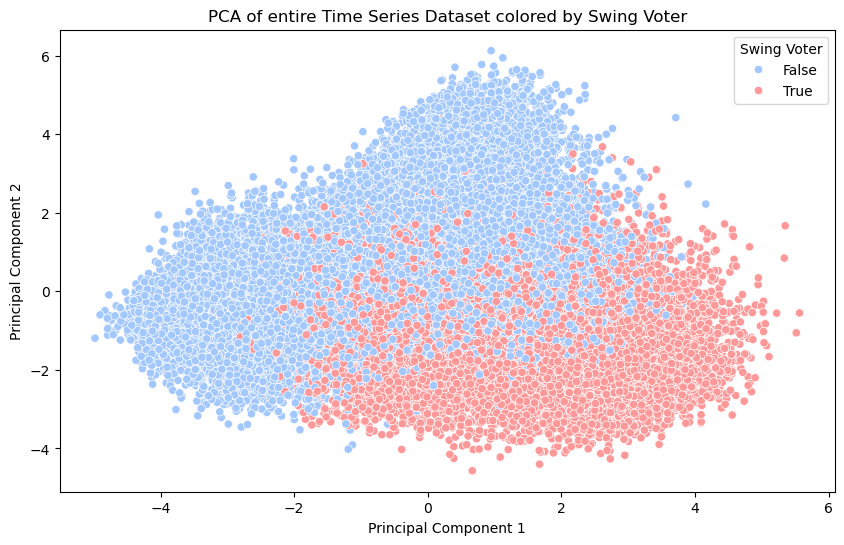

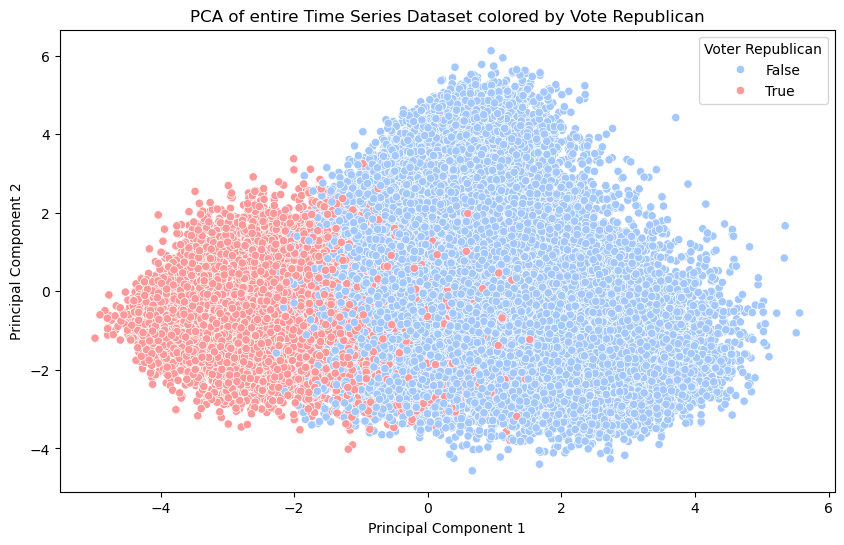

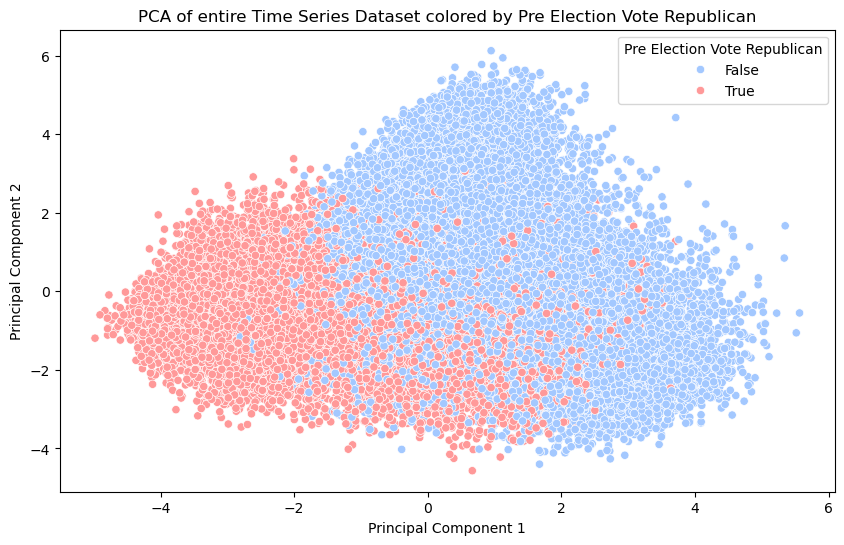

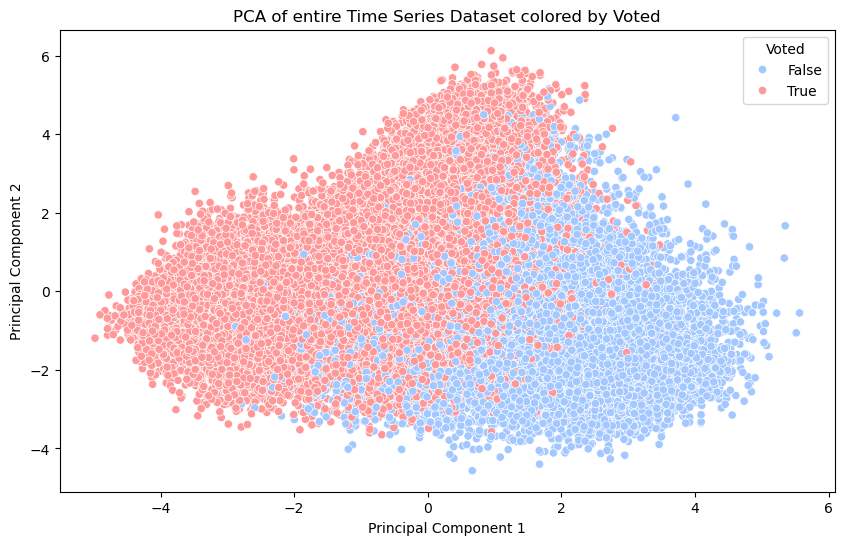

In [225]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Standardizing the data before PCA
scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_time_data)

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame()

# Add the PCA components to the dataframe
pca_df['PC1'] = pca_components[:, 0]
pca_df['PC2'] = pca_components[:, 1]

# Define custom color palettes for True and False
custom_palette = {True: "#FF9999", False: "#A3C8FF"}  # True is red, False is blue

# Plot each case with swapped colors
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['swing_voter'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Swing Voter')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Swing Voter')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['VotePresident_Republican'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Vote Republican')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Voter Republican')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['PRE_IntentVote_Republican'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Pre Election Vote Republican')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Pre Election Vote Republican')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['Voted_Yes'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Voted')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Voted')
plt.show()


# 2020 PCA Analysis


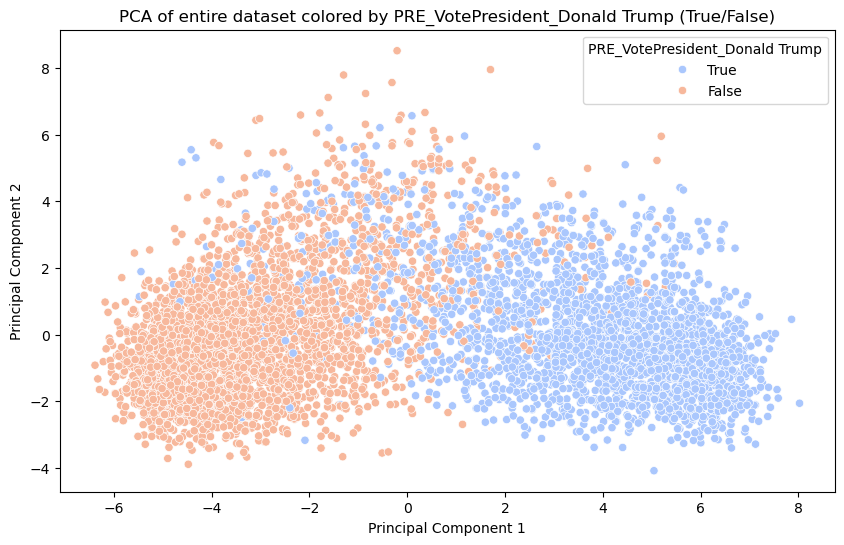

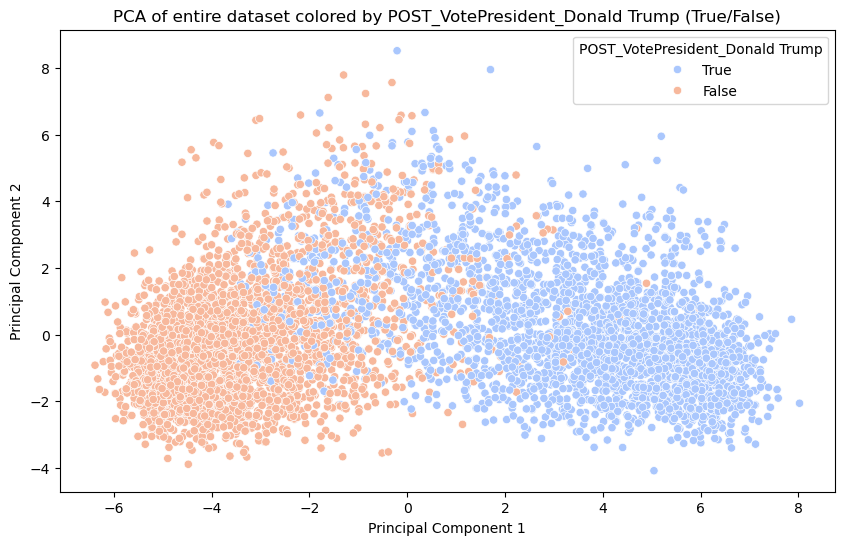

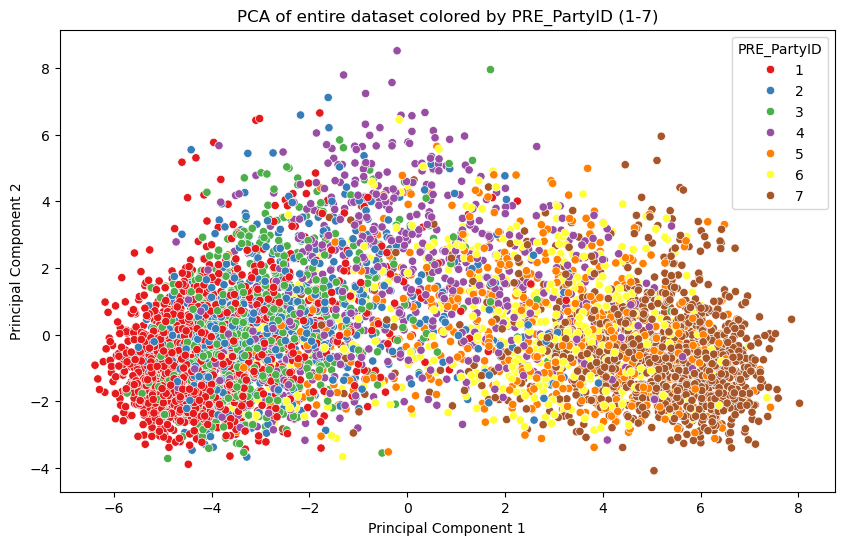

In [226]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the data before PCA
scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_data)

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame()

# Add the PCA components to the dataframe
pca_df['PC1'] = pca_components[:, 0]
pca_df['PC2'] = pca_components[:, 1]

# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['PRE_VotePresident_Donald Trump'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by PRE_VotePresident_Donald Trump (True/False)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='PRE_VotePresident_Donald Trump')
plt.show()

# Plot the data colored by 'POST_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['POST_VotePresident_Donald Trump'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by POST_VotePresident_Donald Trump (True/False)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='POST_VotePresident_Donald Trump')
plt.show()

# Plot the data colored by 'PRE_PartyID' (values 1-7)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['PRE_PartyID'], 
                palette='Set1', legend='full')
plt.title('PCA of entire dataset colored by PRE_PartyID (1-7)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='PRE_PartyID')
plt.show()


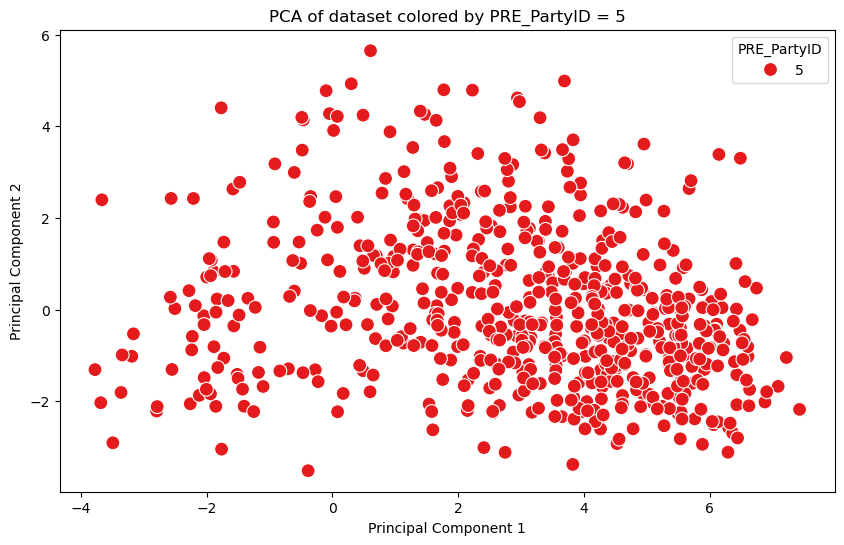

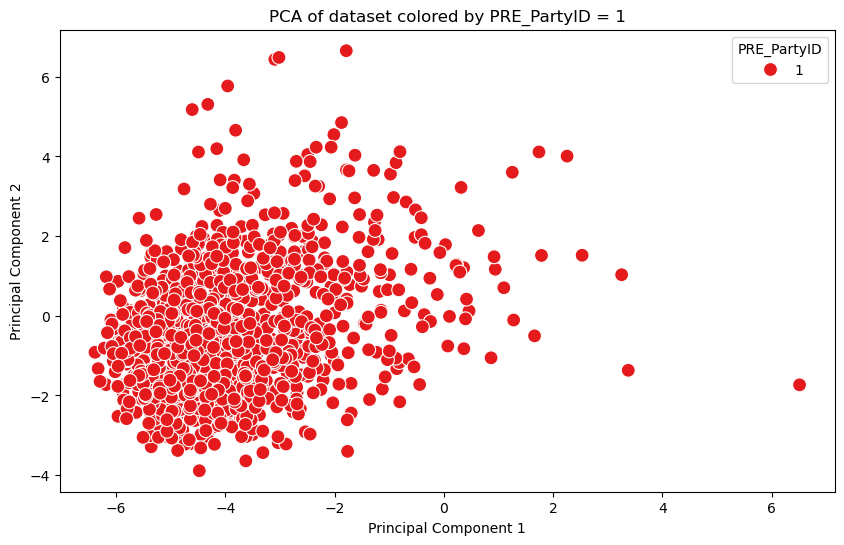

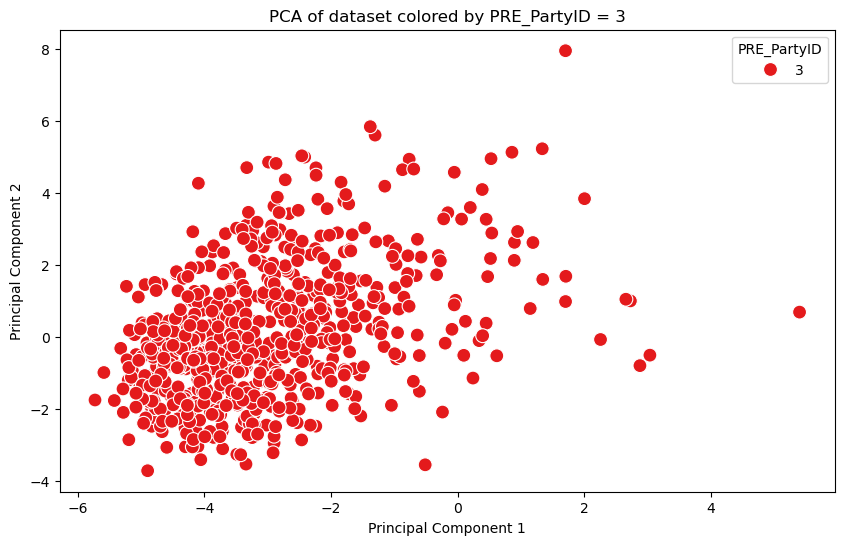

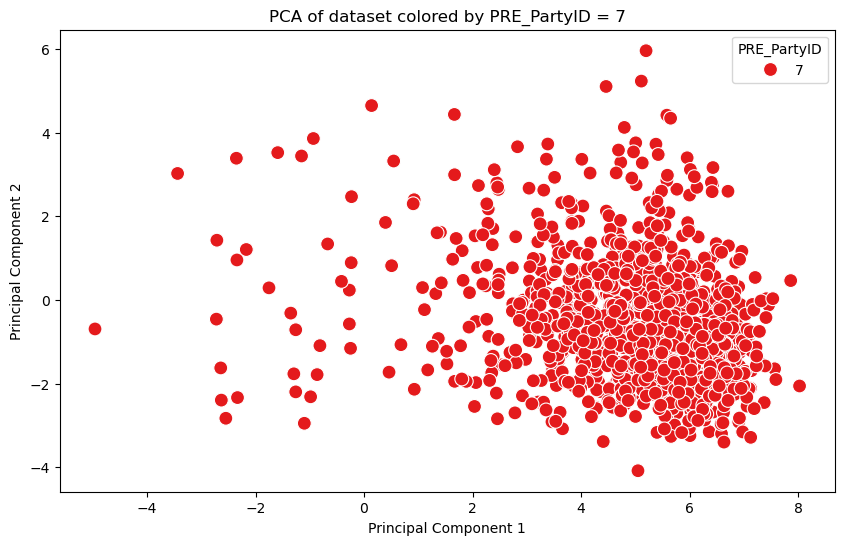

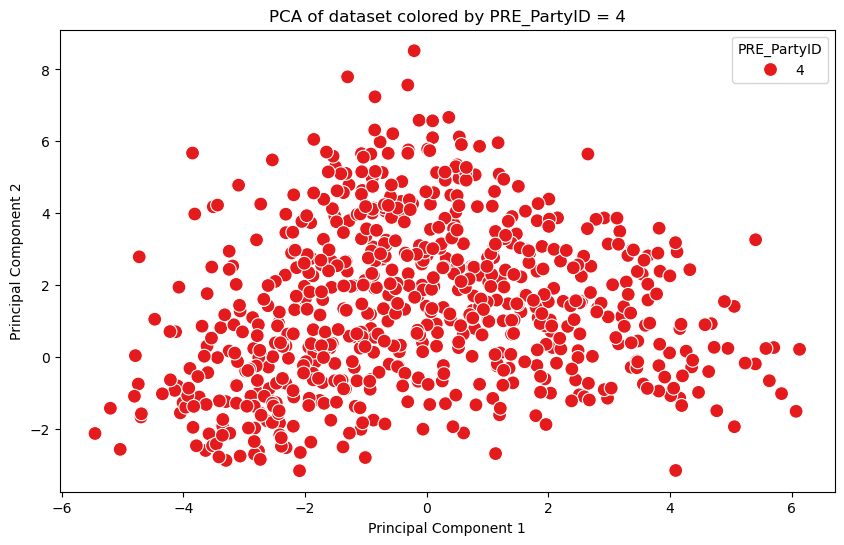

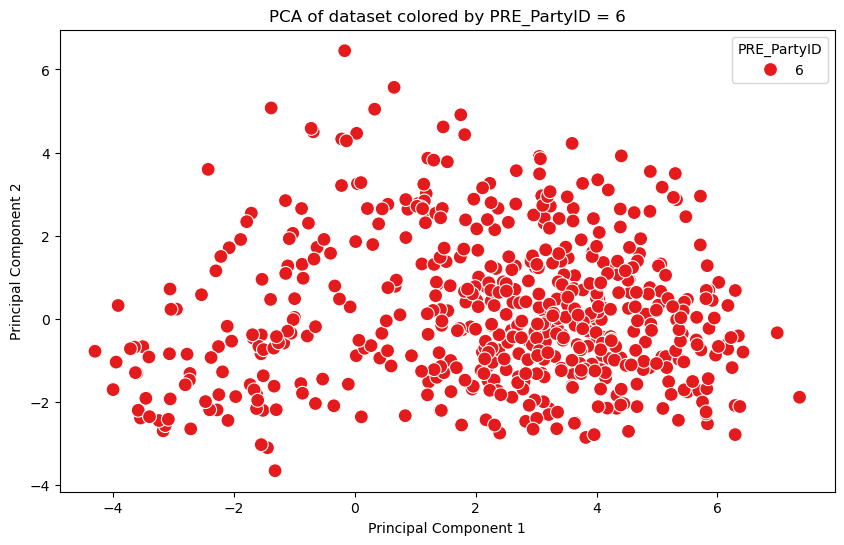

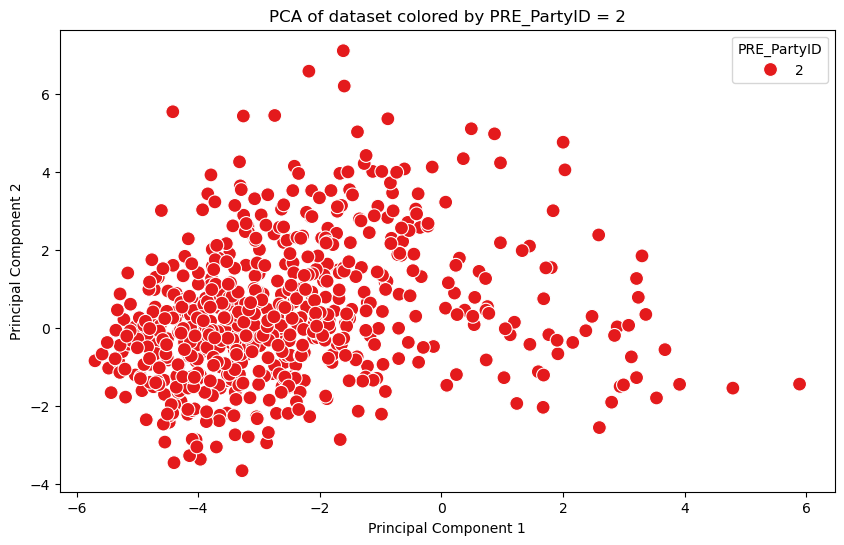

In [227]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Plot the data for each PRE_PartyID value separately
party_ids = train_data['PRE_PartyID'].unique()

pca_df['PRE_PartyID'] = train_data['PRE_PartyID'].values

# Loop through each party ID value and plot the data
for party_id in party_ids:
    plt.figure(figsize=(10, 6))
    
    # Filter data for the specific party ID value
    party_data = pca_df[pca_df['PRE_PartyID'] == party_id]
    
    # Plotting
    sns.scatterplot(x=party_data['PC1'], y=party_data['PC2'], hue=party_data['PRE_PartyID'], 
                    palette='Set1', legend='full', markers='o', s=100)
    
    # Title and labels
    plt.title(f'PCA of dataset colored by PRE_PartyID = {party_id}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='PRE_PartyID')
    plt.show()


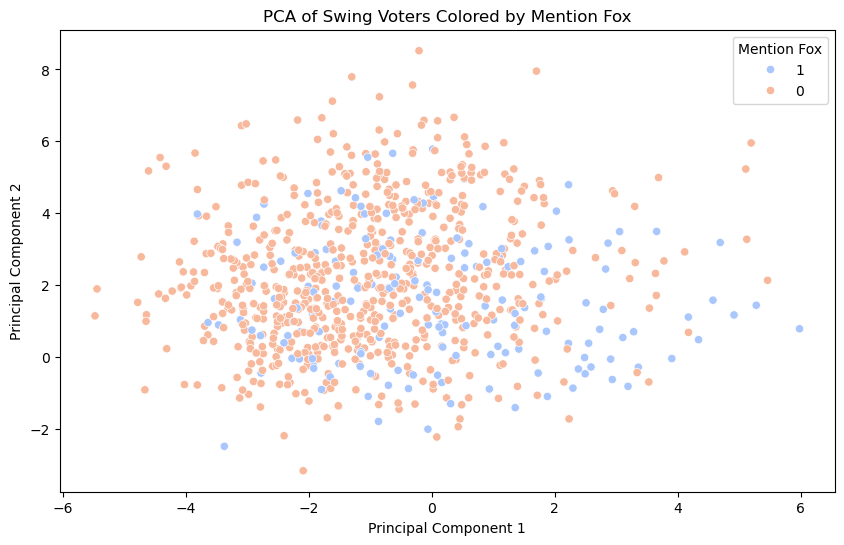

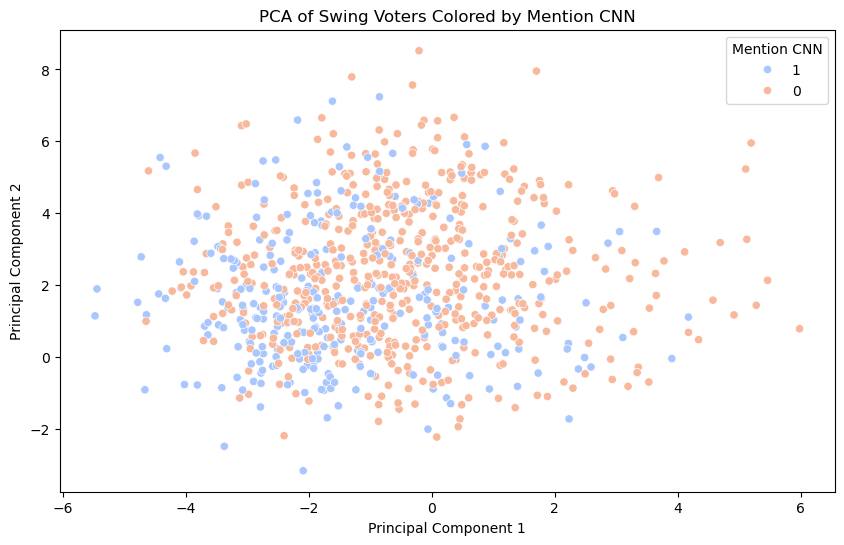

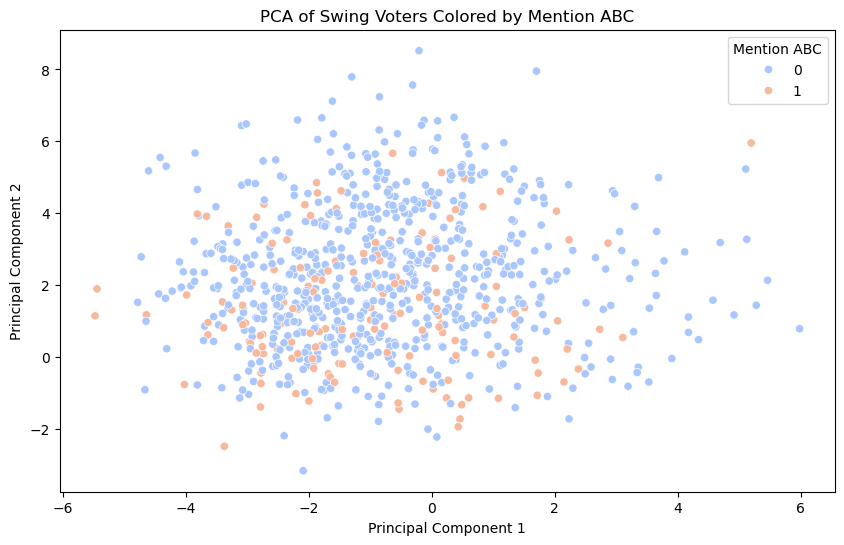

In [228]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data for swing_voters

pca_df['swing_voter'] = train_data['swing_voter']
swing_voters_data = pca_df[pca_df['swing_voter'] == True]

# Plot the data colored by 'mentionFox'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionFox'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention Fox')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention Fox')
plt.show()

# Plot the data colored by 'mentionCNN'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionCNN'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention CNN')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention CNN')
plt.show()

# Plot the data colored by 'mentionABC'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionABC'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention ABC')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention ABC')
plt.show()


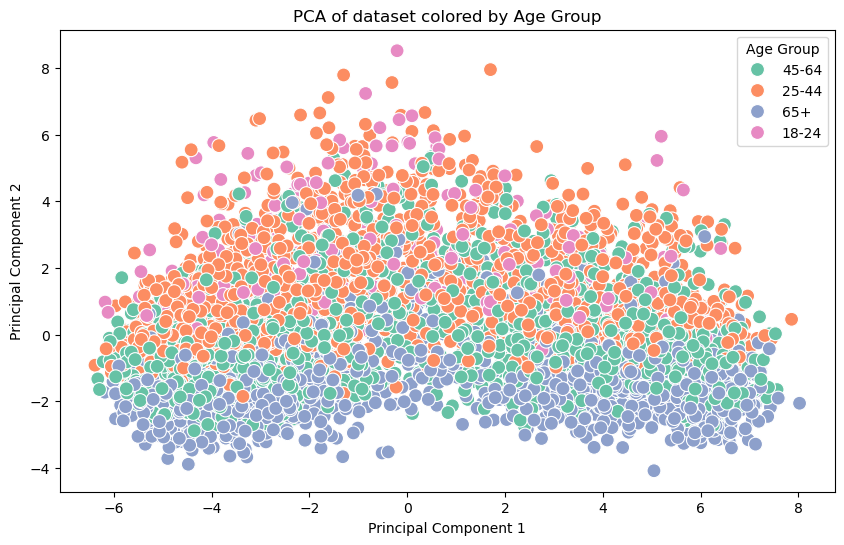

In [229]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Categorize the 'age' column into age groups
def categorize_age(age):
    if 18 <= age <= 24:
        return '18-24'
    elif 25 <= age <= 44:
        return '25-44'
    elif 45 <= age <= 64:
        return '45-64'
    else:
        return '65+'

# Apply the categorization function to the 'age' column
train_data['age_group'] = train_data['Age'].apply(categorize_age)

# Standardizing the data before PCA (same as before)
columns_for_pca = [col for col in train_data.columns if col not in ['PRE_VotePresident_Donald Trump', 
                                                                   'POST_VotePresident_Donald Trump', 
                                                                   'PRE_PartyID', 'Age', 'age_group']]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_data[columns_for_pca])

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

# Add the PCA components to the dataframe
train_data['PC1'] = pca_components[:, 0]
train_data['PC2'] = pca_components[:, 1]

# Plot all the data with colors based on age group
plt.figure(figsize=(10, 6))

# Plotting the scatter plot
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['age_group'], 
                palette='Set2', legend='full', markers='o', s=100)

# Title and labels
plt.title('PCA of dataset colored by Age Group')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Age Group')

plt.show()


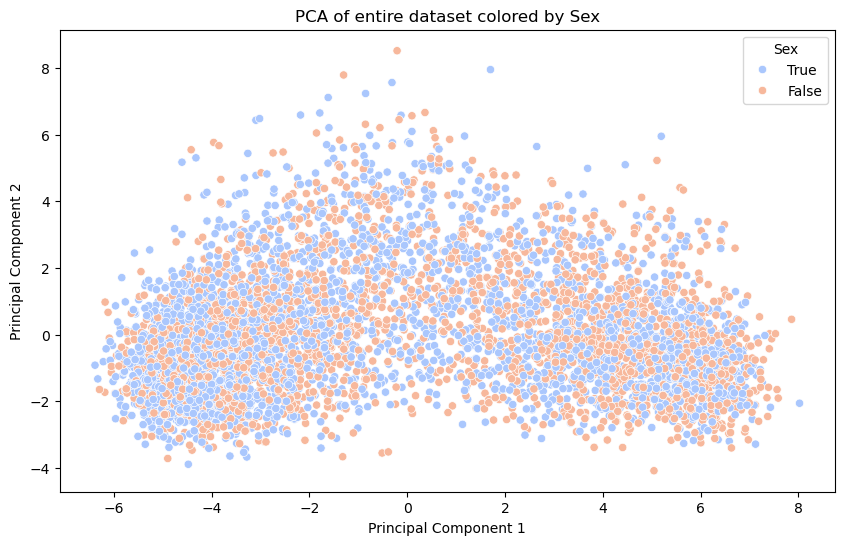

In [230]:
# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['Sex_Female'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Sex')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Sex')
plt.show()

# Difference in Swing Voter Population vs Overall - Trend Analysis

In [231]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

def analyze_difference_trends(df, dict_time_series, cat_label, swing_voter_filter=False): 
    """
    Analyze the difference in trends between overall voters and swing voters for each column,
    focusing only on the differences. For multi-category trends, each category has its own line.

    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.
        swing_voter_filter (bool): Whether to filter for swing voters or not. Defaults to False.

    Returns:
        None: Visualizes the difference in trends between swing voters and overall population over time.
    """
    # Ensure the "Year" column exists for grouping
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")
        
    # Get the unique years for the x-axis limits
    unique_years = sorted(df[time_column].unique())

    # Standardized plot size (width, height) in inches
    plot_width = 12
    plot_height = 8

    # Define a color palette for categories (using seaborn's color palette)
    color_palette = sns.color_palette("Set2")  # Choose a color palette

    # Iterate over each row in the DataFrame (i.e., the metadata for each entry)
    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical columns (non-one-hot encoded)
            # Group by the time column and the categorical column to calculate trends
            if column_name not in df.columns:
                print(f"Column '{column_name}' not found in DataFrame.")
                continue

            # Function to calculate the trend for both overall and swing voters
            def calculate_trend(data):
                # Group by time and calculate the percentage of each category in the column
                trend = data.groupby([time_column, column_name]).size().unstack(fill_value=0)
                trend_percentage = (trend.div(trend.sum(axis=1), axis=0) * 100)  # Normalize to percentages
                return trend_percentage

            # Calculate trends for overall and swing voters
            overall_trend_percentage = calculate_trend(df)  # Overall trend
            swing_voter_trend_percentage = calculate_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend_percentage - overall_trend_percentage

            # Plotting the difference between trends for both overall and swing voters
            plt.figure(figsize=(plot_width, plot_height))

            # Check if there are multiple categories and plot only one if there are 2
            if len(overall_trend_percentage.columns) == 2:
                category = overall_trend_percentage.columns[1]  # Pick the second category
                cat_name = cat_label[dict_time_series[dict_time_series['column'] ==column_name].index[0]]['labels'][category]
                plt.plot(trend_difference.index, trend_difference[category], 
                         label=f'Difference for {cat_name}', color=color_palette[0], linewidth=2)
            else:
                # If there are more than two categories, plot the first one by default
                for idx, category in enumerate(overall_trend_percentage.columns):
                    cat_name = cat_label[dict_time_series[dict_time_series['column'] ==column_name].index[0]]['labels'][category]
                    plt.plot(trend_difference.index, trend_difference[category], 
                             label=f'Difference for {cat_name}', color=color_palette[idx], linewidth=2)

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Difference in Percentage (%)", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(title="Categories", loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

        elif column_type in ["num", "rank"]:
            # Handle numerical columns (e.g., average values, ranks)
            def calculate_numeric_trend(data):
                # Group by time and compute the mean for the numerical column
                return data.groupby(time_column)[column_name].mean()

            # Calculate trends for overall and swing voters
            overall_trend = calculate_numeric_trend(df)  # Overall trend
            swing_voter_trend = calculate_numeric_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend - overall_trend

            # Plotting the difference between trends for numerical data
            plt.figure(figsize=(plot_width, plot_height))
            plt.plot(trend_difference.index, trend_difference, label="Trend Difference", 
                     color=color_palette[0], linewidth=2)

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Difference in Value", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

        else:
            print(f"Unsupported column type '{column_type}' for column '{column_name}'.")


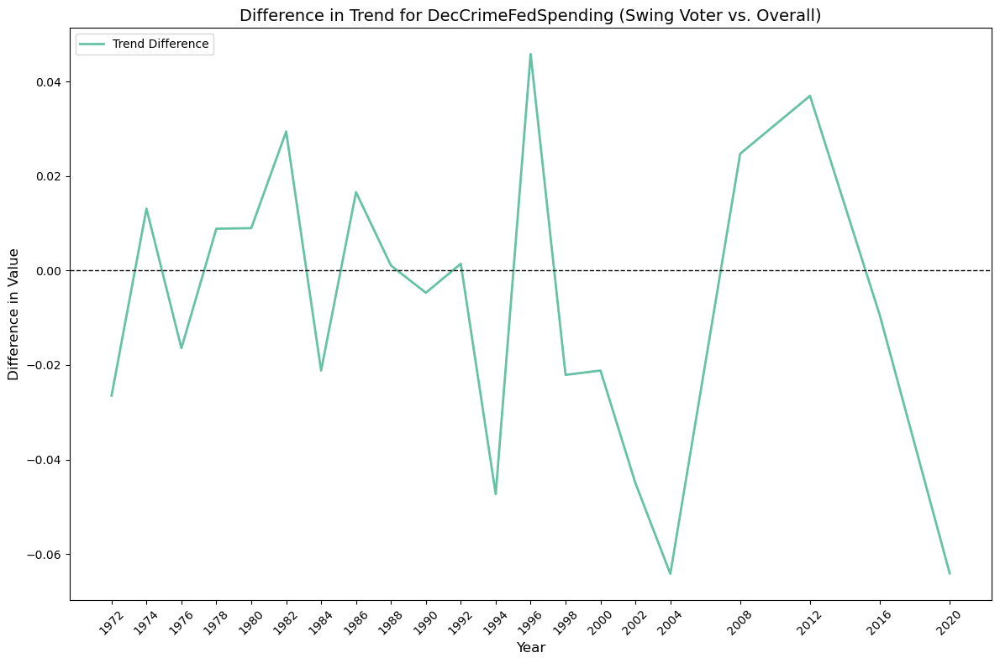

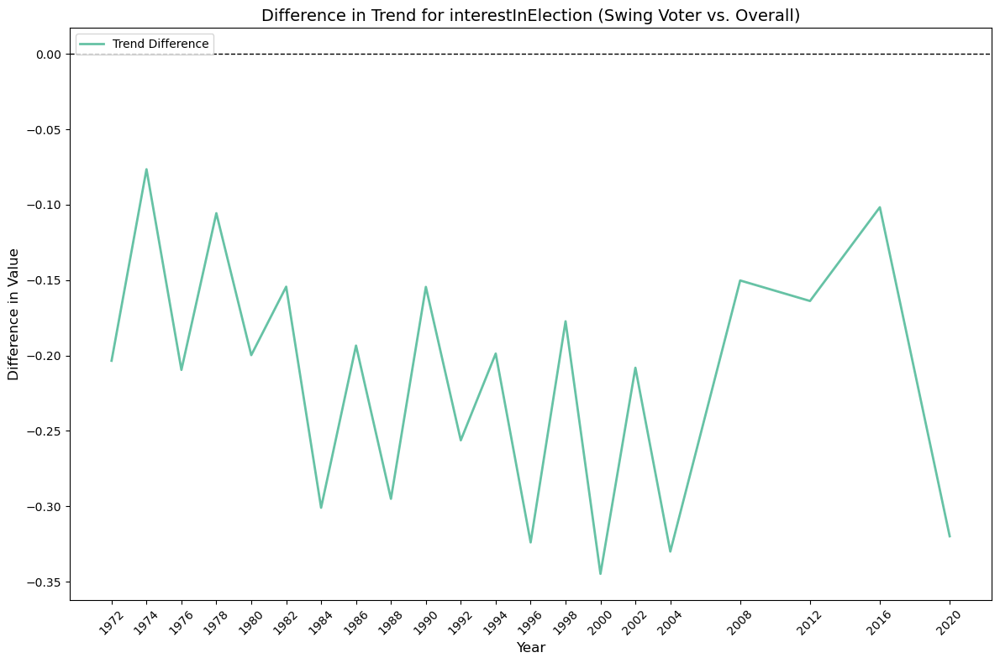

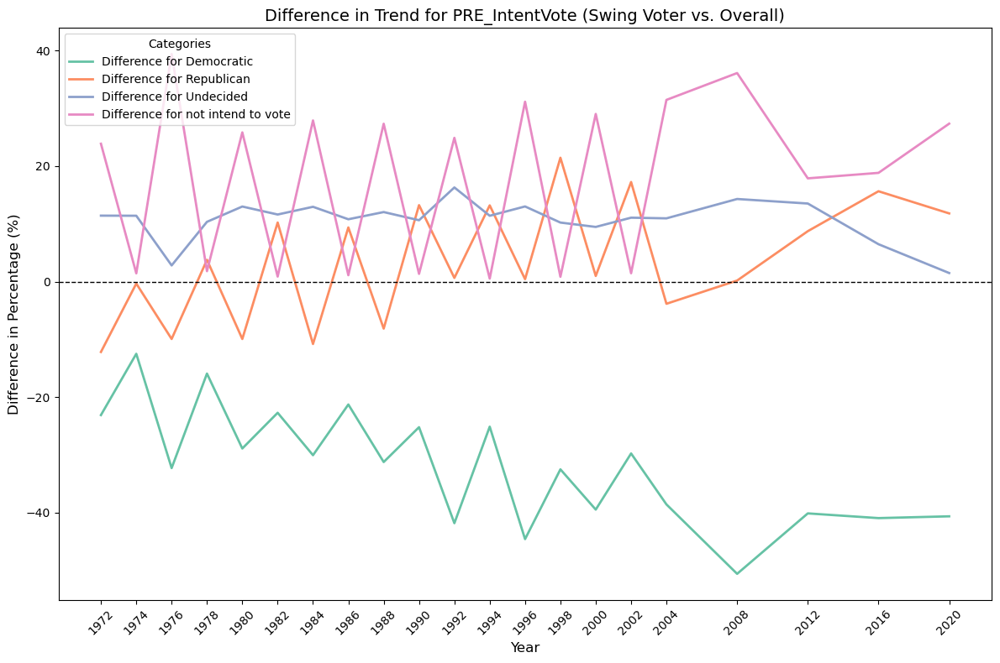

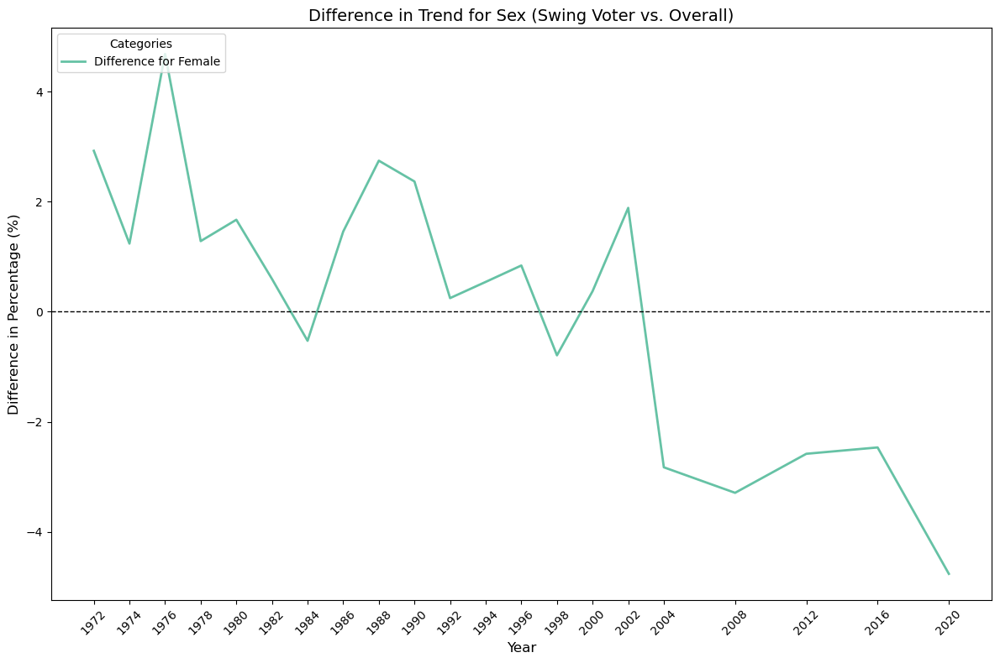

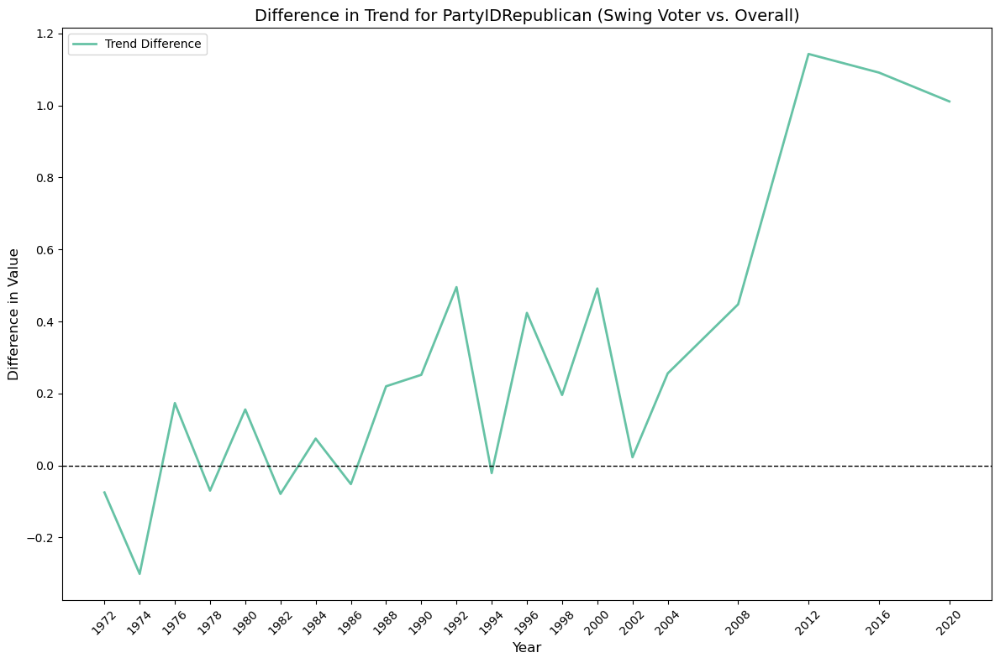

...

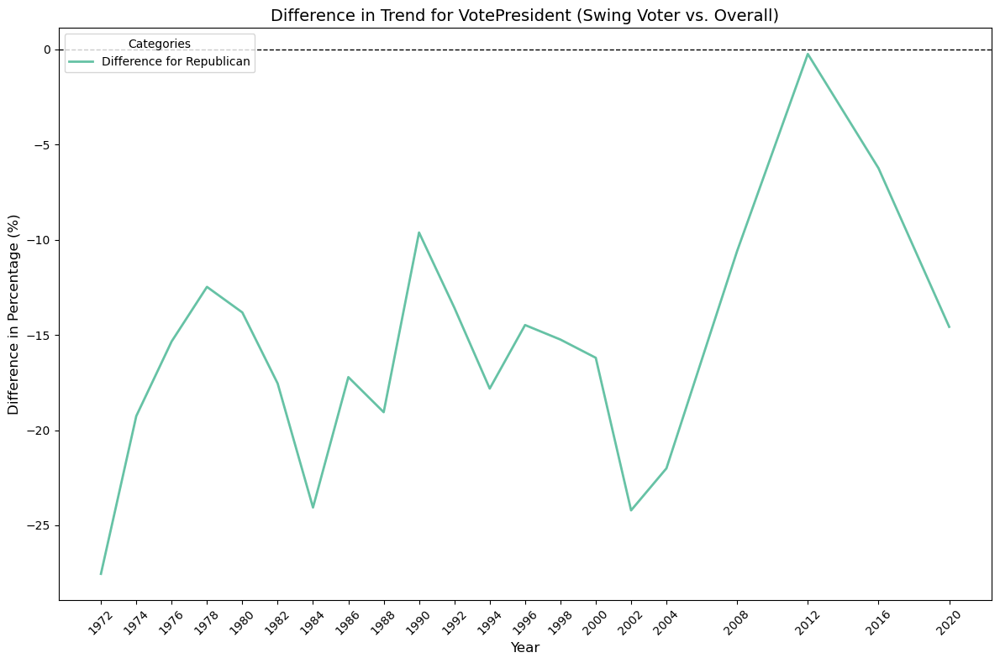

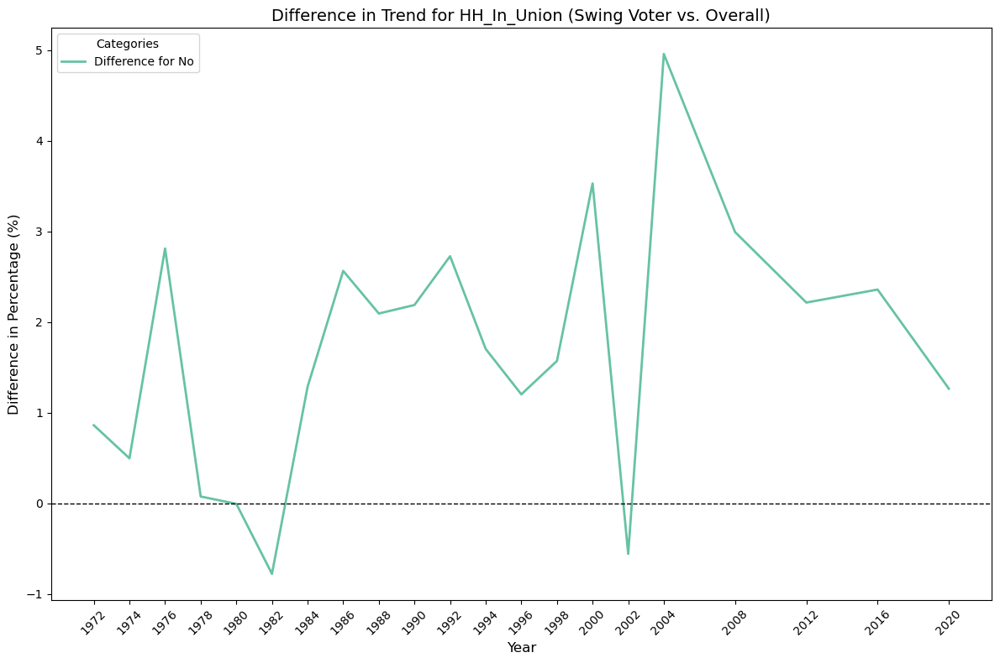

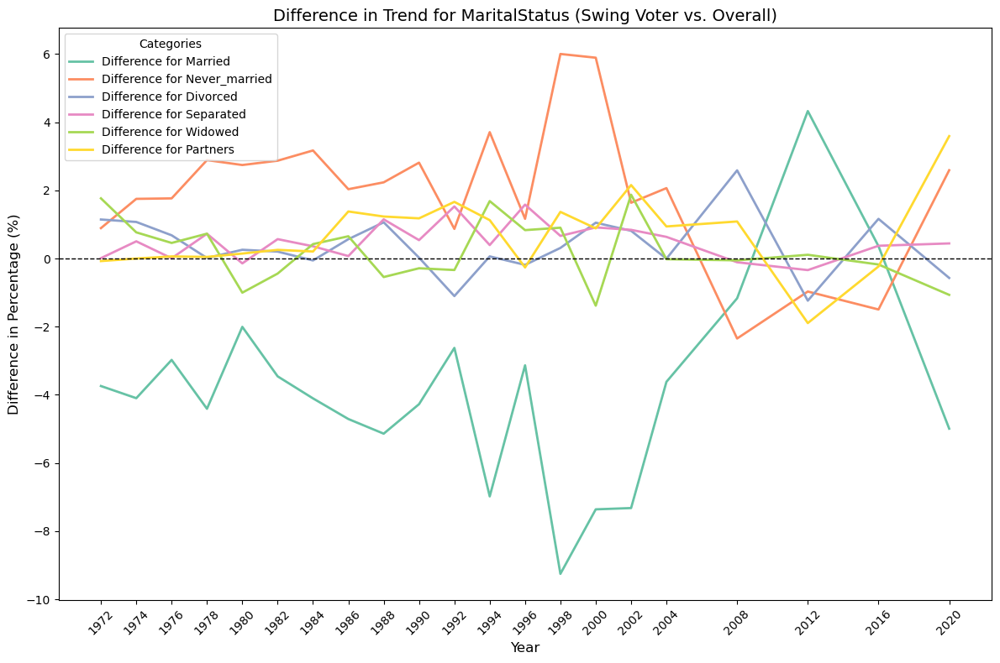

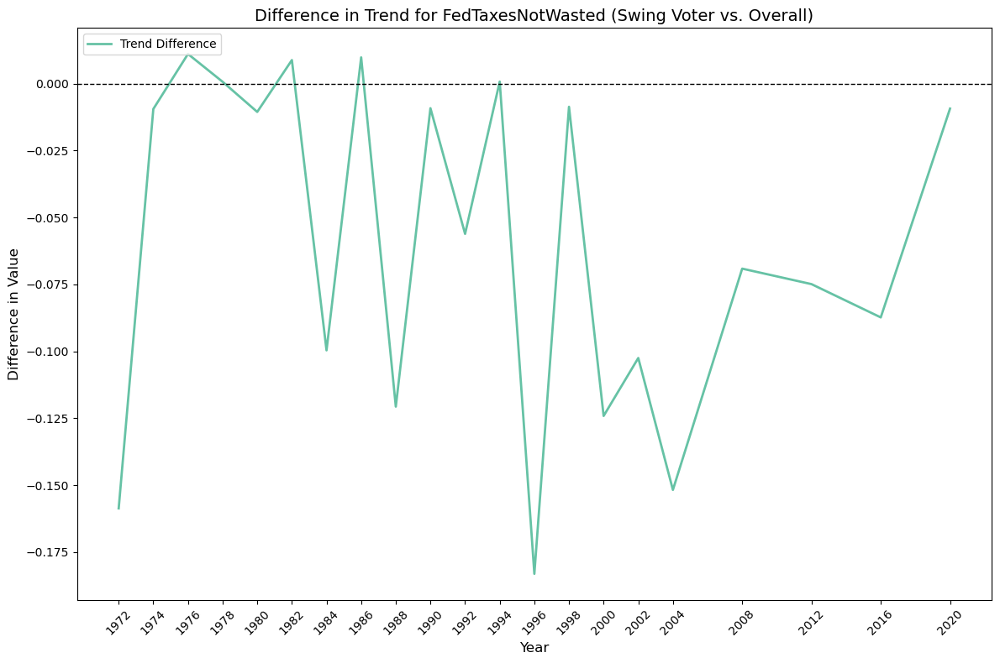

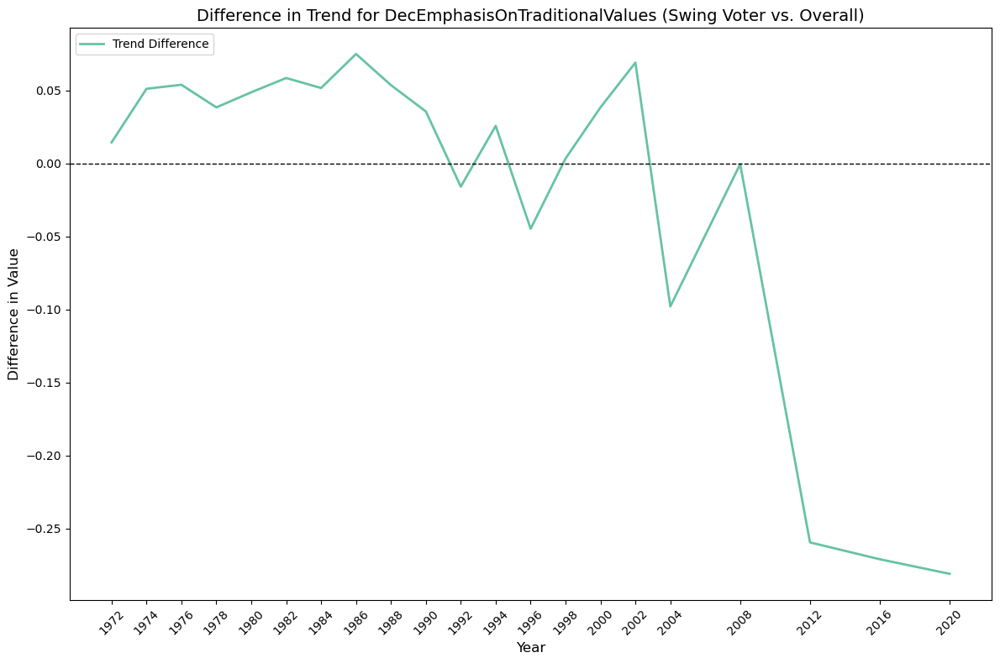

In [232]:
analyze_difference_trends(time_series_notOneHot, dict_time_series, cat_labeled_time, True)

In [233]:
def analyze_difference_trends_loess(df, dict_time_series, cat_label, swing_voter_filter=False, smoothing_factor=0.3):
    """
    Analyze the difference in trends between overall voters and swing voters for each column,
    focusing only on the differences. For multi-category trends, each category has its own line.
    LOESS smoothing is applied to the trends.
    
    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.
        swing_voter_filter (bool): Whether to filter for swing voters or not. Defaults to False.

    Returns:
        None: Visualizes the difference in trends between swing voters and overall population over time.
    """
    # Ensure the "Year" column exists for grouping
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")
        
    # Get the unique years for the x-axis limits
    unique_years = sorted(df[time_column].unique())

    # Standardized plot size (width, height) in inches
    plot_width = 12
    plot_height = 8

    # Define a color palette for categories (using seaborn's color palette)
    color_palette = sns.color_palette("Set2")  # Choose a color palette

    # LOESS Smoothing function
    def loess_smoothing(x, y, frac=smoothing_factor):
        lowess = sm.nonparametric.lowess
        smoothed = lowess(y, x, frac=frac)
        return smoothed[:, 0], smoothed[:, 1]

    # Iterate over each row in the DataFrame (i.e., the metadata for each entry)
    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical columns (non-one-hot encoded)
            if column_name not in df.columns:
                print(f"Column '{column_name}' not found in DataFrame.")
                continue

            # Function to calculate the trend for both overall and swing voters
            def calculate_trend(data):
                # Group by time and calculate the percentage of each category in the column
                trend = data.groupby([time_column, column_name]).size().unstack(fill_value=0)
                trend_percentage = (trend.div(trend.sum(axis=1), axis=0) * 100)  # Normalize to percentages
                return trend_percentage

            # Calculate trends for overall and swing voters
            overall_trend_percentage = calculate_trend(df)  # Overall trend
            swing_voter_trend_percentage = calculate_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend_percentage - overall_trend_percentage

            # Plotting the difference between trends for both overall and swing voters
            plt.figure(figsize=(plot_width, plot_height))
            
            # Check if there are multiple categories and plot only one if there are 2
            if len(overall_trend_percentage.columns) == 2:
                # Select the second category
                category = overall_trend_percentage.columns[1]  # Correct index
                y = trend_difference[category]
                smoothed_x, smoothed_y = loess_smoothing(trend_difference.index, y, frac=0.2)
                cat_name = cat_label[dict_time_series[dict_time_series['column'] == column_name].index[0]]['labels'][category]
                plt.plot(smoothed_x, smoothed_y, label=f'Difference for {cat_name}', color=color_palette[0], linewidth=2)
                
            else:
                # Iterate through categories
                for idx, category in enumerate(overall_trend_percentage.columns):
                    cat_name = cat_label[dict_time_series[dict_time_series['column'] == column_name].index[0]]['labels'][category]

                    # Apply LOESS smoothing to the trend difference
                    x = trend_difference.index
                    y = trend_difference[category]
                    smoothed_x, smoothed_y = loess_smoothing(x, y, frac=0.2)

                    plt.plot(smoothed_x, smoothed_y, label=f'Difference for {cat_name}', color=color_palette[idx], linewidth=2)

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Difference in Percentage (%)", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(title="Categories", loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

        elif column_type in ["num", "rank"]:
            # Handle numerical columns (e.g., average values, ranks)
            def calculate_numeric_trend(data):
                # Group by time and compute the mean for the numerical column
                return data.groupby(time_column)[column_name].mean()

            # Calculate trends for overall and swing voters
            overall_trend = calculate_numeric_trend(df)  # Overall trend
            swing_voter_trend = calculate_numeric_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend - overall_trend

            # Apply LOESS smoothing
            smoothed_x, smoothed_y = loess_smoothing(trend_difference.index, trend_difference, frac=0.2)

            # Plotting the difference between trends for numerical data
            plt.figure(figsize=(plot_width, plot_height))
            plt.plot(smoothed_x, smoothed_y, label="Trend Difference", color=color_palette[0], linewidth=2)

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Difference in Value", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

        else:
            print(f"Unsupported column type '{column_type}' for column '{column_name}'.")


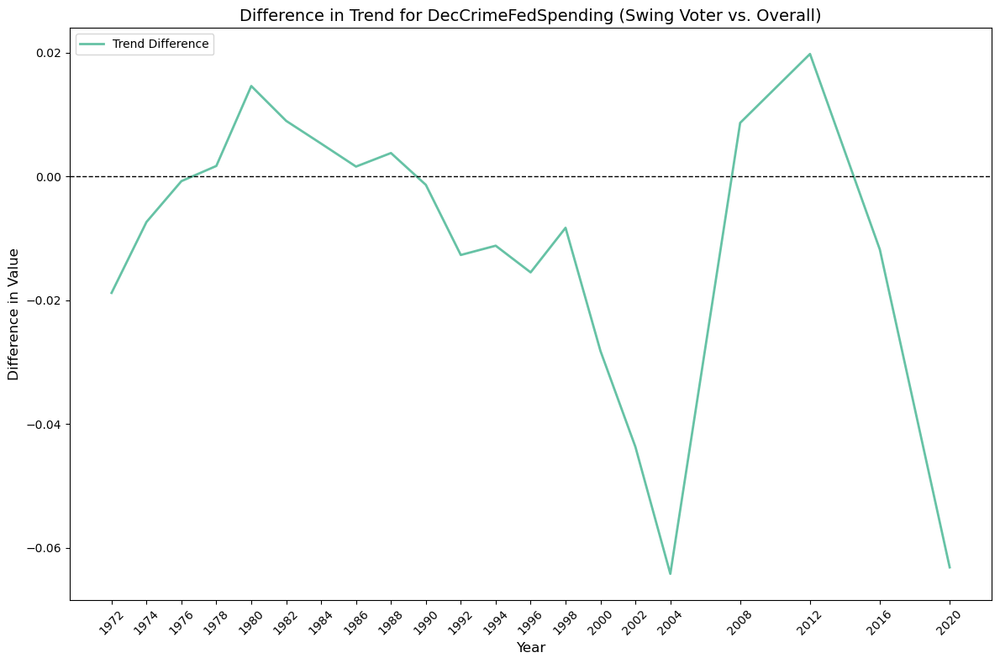

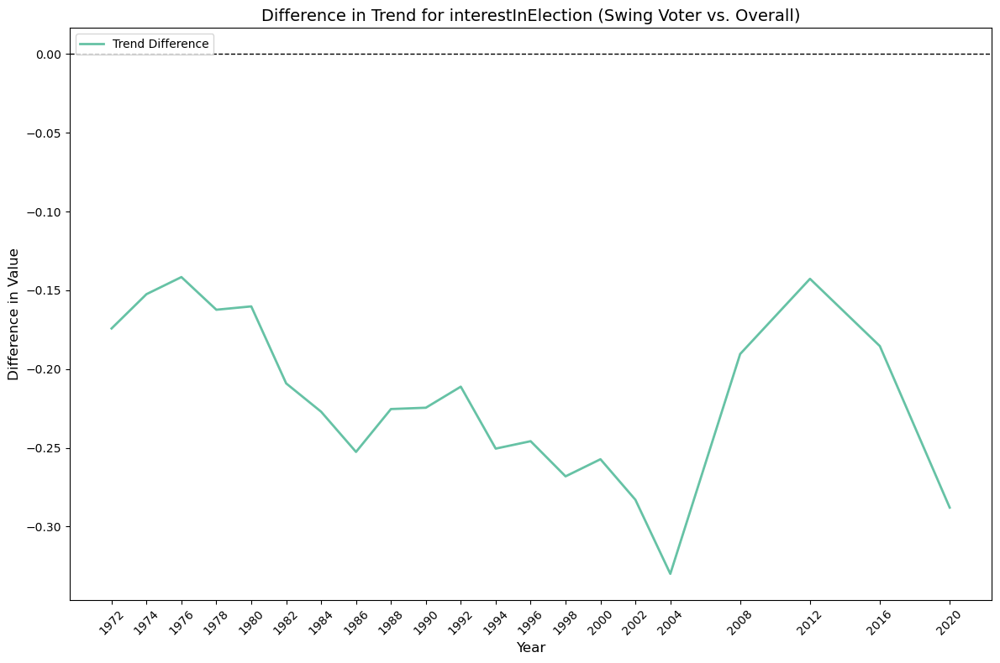

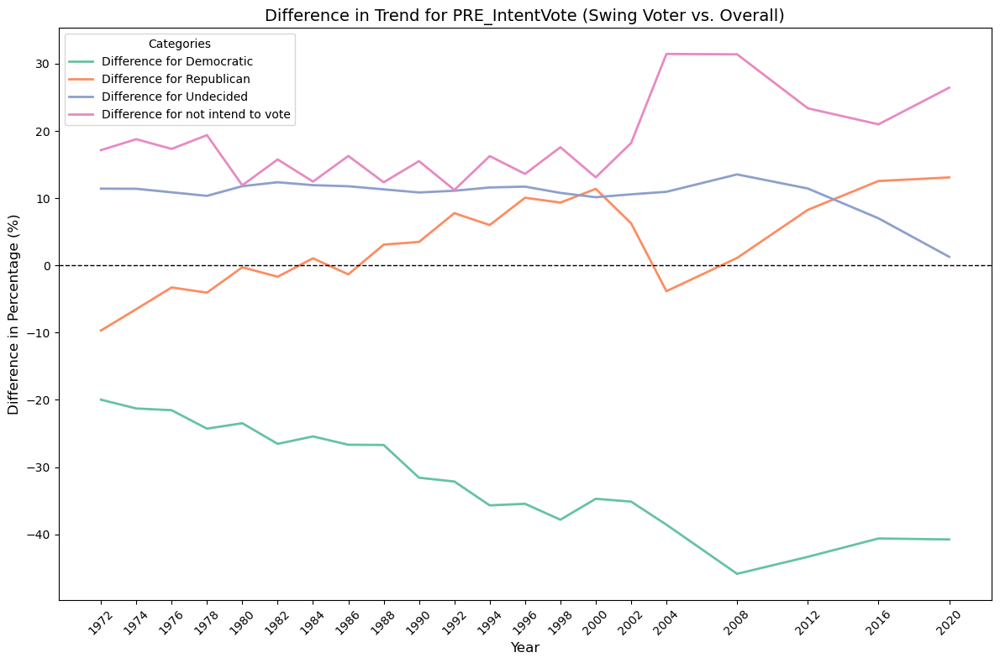

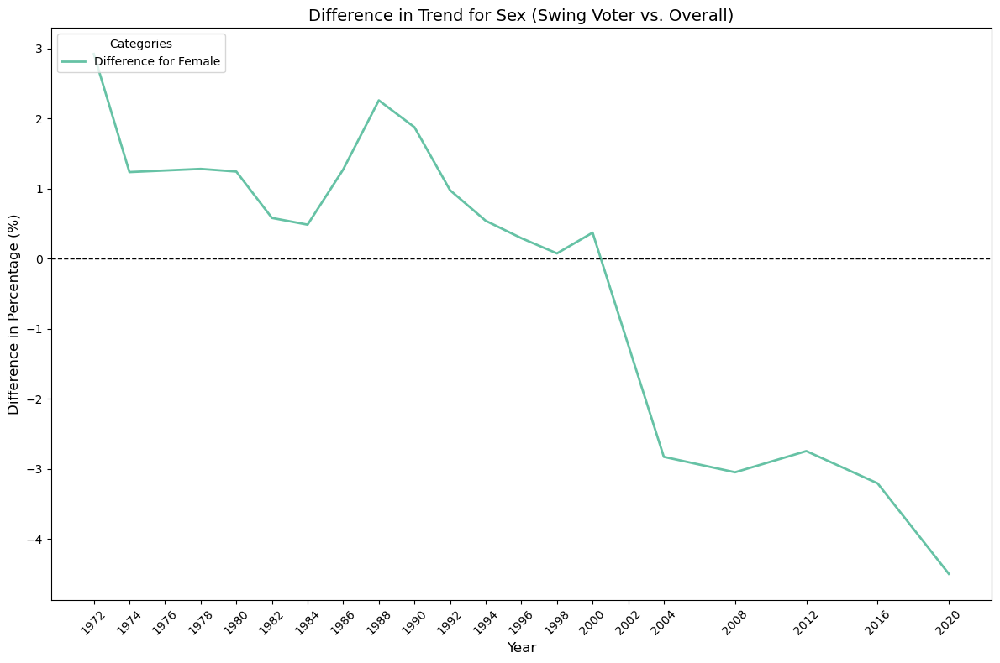

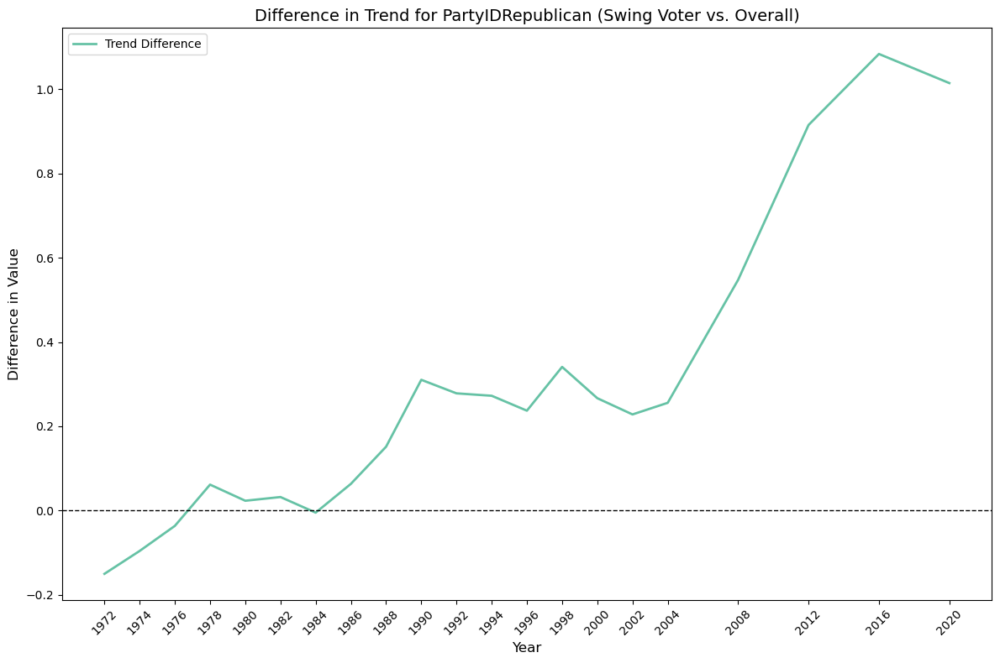

...

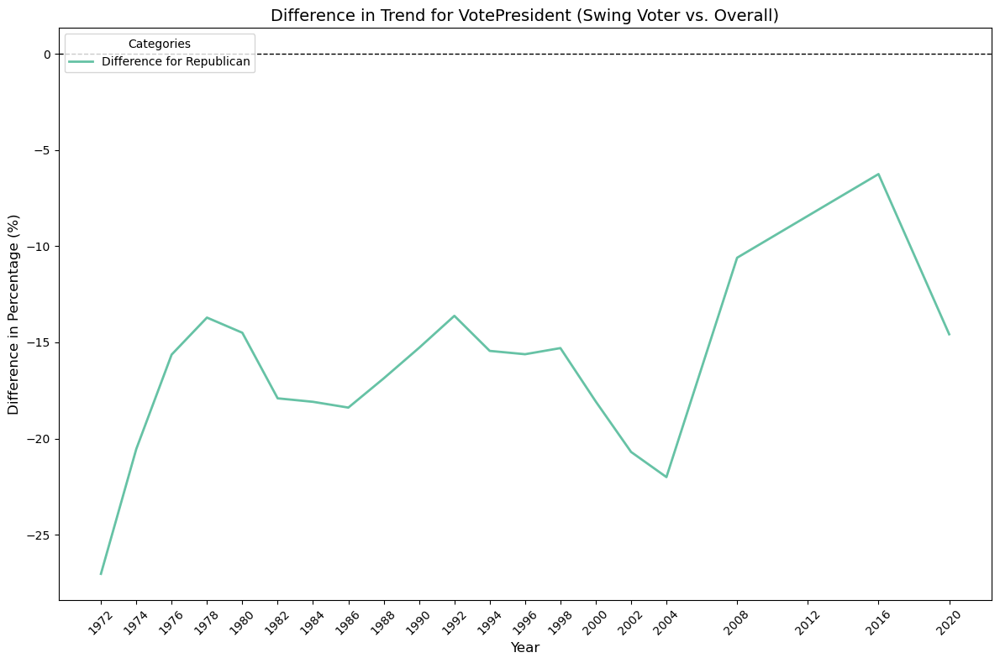

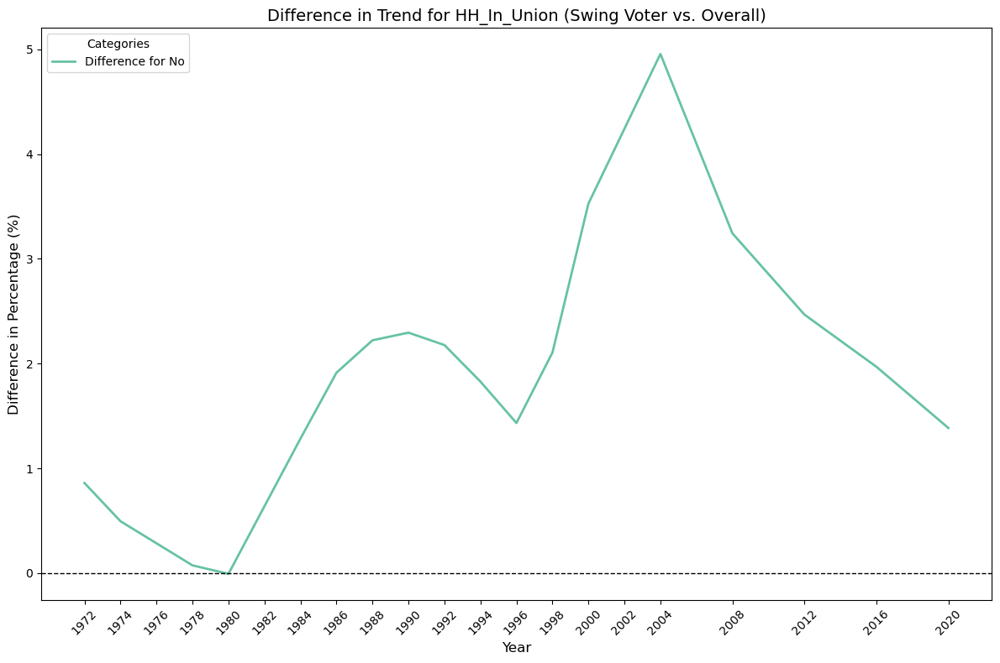

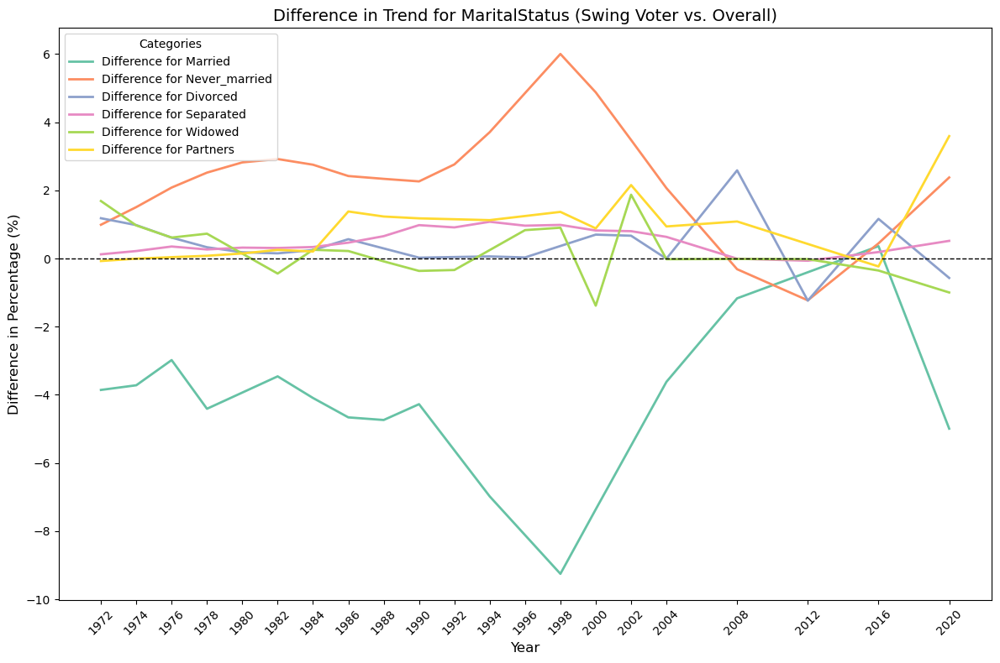

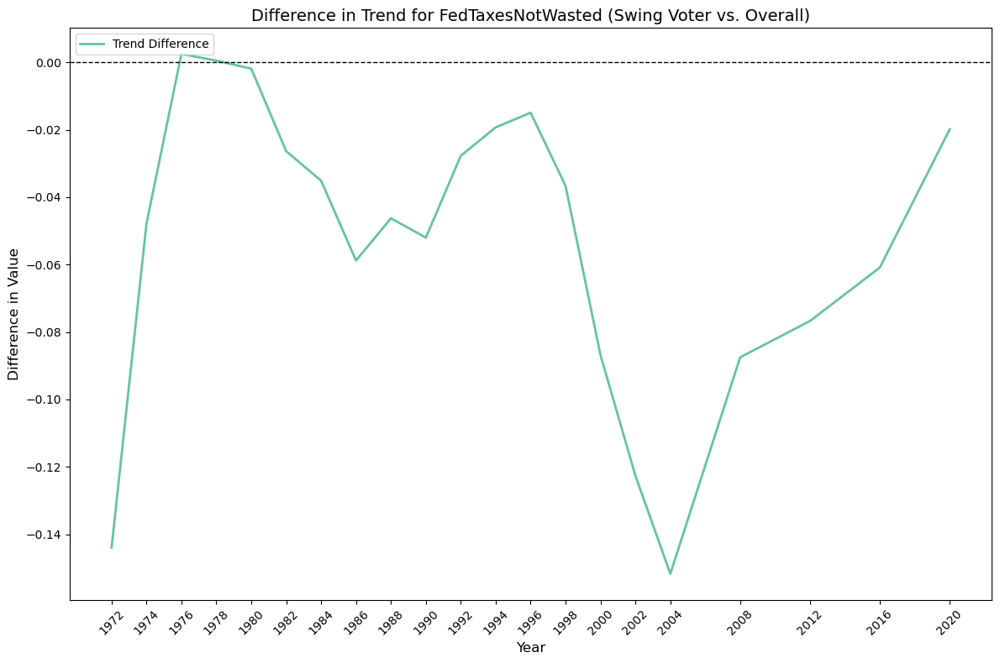

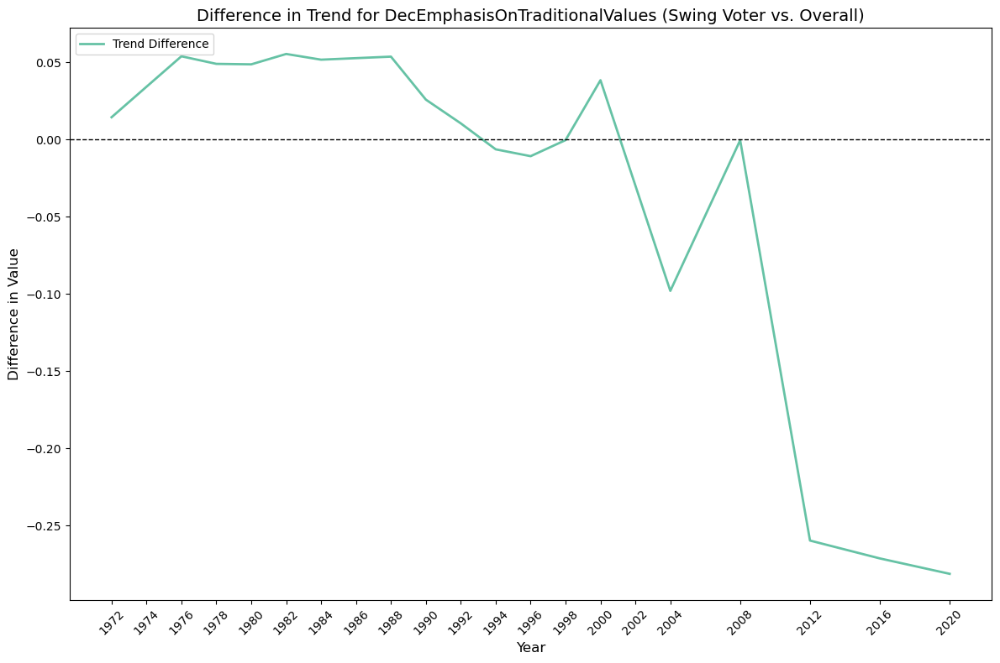

In [234]:
analyze_difference_trends_loess(time_series_notOneHot, dict_time_series, cat_labeled_time)

In [277]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind, mannwhitneyu, chi2_contingency

# Iterate through each column and year
results = []
for col in train_time_data.columns:
    if col in ['Year', 'swing_voter']:  # Skip these columns
        continue
    
    for year in train_time_data['Year'].unique():
        # Filter data for the current year
        year_data = train_time_data[train_time_data['Year'] == year]
        
        # Split into overall population and swing voters
        overall = year_data[col].dropna()  # Drop NaN values for valid statistical testing
        swing_voters = year_data[year_data['swing_voter'] == True][col].dropna()
        
        if overall.empty or swing_voters.empty:  # Skip if no data available
            continue
        
        # Continuous vs Categorical check
        if np.issubdtype(year_data[col].dtype, np.number):  # Numeric column
            # Test normality assumption (optional, e.g., Shapiro-Wilk test) to decide between t-test or Mann-Whitney
            _, p_value = ttest_ind(overall, swing_voters, equal_var=False)  # Welch’s t-test
        else:  # Categorical column
            contingency_table = pd.crosstab(year_data[col], year_data['swing_voter'])
            _, p_value, _, _ = chi2_contingency(contingency_table)
        
        # Store the result
        results.append({
            'Year': year,
            'Column': col,
            'P-Value': p_value,
            'Significant': p_value < 0.05  # Statistical significance at alpha=0.05
        })

# Convert results to a DataFrame for easier analysis
results_df = pd.DataFrame(results)

# Display significant results
print("Significant Results:")
print(results_df[results_df['Significant']])


Significant Results:
       Year                  Column       P-Value  Significant
4    2020.0     DecCrimeFedSpending  1.530389e-03         True
16   2002.0     DecCrimeFedSpending  4.955992e-02         True
21   1984.0      interestInElection  6.331190e-18         True
22   2016.0      interestInElection  2.435593e-05         True
24   1976.0      interestInElection  5.183243e-10         True
..      ...                     ...           ...          ...
873  1998.0  MaritalStatus_Partners  1.752954e-03         True
877  2002.0  MaritalStatus_Partners  3.963508e-05         True
878  1992.0  MaritalStatus_Partners  1.508705e-02         True
880  1990.0  MaritalStatus_Partners  1.274230e-04         True
881  1994.0  MaritalStatus_Partners  6.079200e-03         True

[396 rows x 4 columns]


In [285]:
sig_res = results_df[results_df['Significant']]
print("Significant over the years :")
print(sig_res['Column'].value_counts())
print()
print("Significant in since 2008:")
sig_res[sig_res['Year'] >= 2008.0]['Column'].value_counts()

Significant over the years :
Column
Voted_Yes                                          21
RegistrationStatus_Yes                             21
PRE_IntentVote_Undecided                           21
PRE_IntentVote_not intend to vote                  21
EducationLevel_College                             20
VotePresident_Republican                           20
interestInElection                                 20
EducationLevel_High school                         19
Income_68 to 95 percentile                         17
Age                                                15
PRE_IntentVote_Republican                          15
WeakReligiousAttendence                            14
Income_96 to 100 percentile                        12
MaritalStatus_Never_married                        11
Income_17 to 33 percentile                         10
IncPrivateMedInsurance                             10
Race_Hispanic                                       9
Region_South                                  

Column
PRE_IntentVote_Undecided                           4
PartyIDRepublican                                  4
WorseEconomyView                                   4
Voted_Yes                                          4
RegistrationStatus_Yes                             4
Race_Black                                         4
PRE_IntentVote_not intend to vote                  4
DecEmphasisOnTraditionalValues                     3
EducationLevel_Some college                        3
interestInElection                                 3
AbortionRightsSC_choice                            3
AbortionRightsSC_exception_rape_incest_saveLife    3
EducationLevel_College                             3
PRE_IntentVote_Republican                          3
IncPrivateMedInsurance                             3
IncDefenseSpending                                 3
VotePresident_Republican                           3
IncSpendingServices                                3
Race_Hispanic                          

# Model Evaluation

In [235]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.preprocessing import OneHotEncoder, scale, StandardScaler
import statsmodels.api as sm
from itertools import product
from joblib import Parallel, delayed
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Select features to normalize (e.g., numerical columns only)
numerical_features = [dict_time_series.loc[col]["column"] for col in dict_time_series.index if dict_time_series.loc[col]["type"] == "rank" or dict_time_series.loc[col]["type"] == "num"]

train_time_data_scaled = train_time_data
val_time_data_scaled = val_time_data
test_time_data_scaled = test_time_data
test_2020_data_scaled = test_2020_data

train_time_data_scaled[numerical_features] = scaler.fit_transform(train_time_data[numerical_features])
val_time_data_scaled[numerical_features] = scaler.transform(val_time_data[numerical_features])
test_time_data_scaled[numerical_features] = scaler.transform(test_time_data[numerical_features])
test_2020_data_scaled[numerical_features] = scaler.transform(test_2020_data[numerical_features])

y_train_time = train_time_data_scaled['swing_voter']
X_train_time = train_time_data_scaled.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

y_val_time = val_time_data_scaled['swing_voter']
X_val_time = val_time_data_scaled.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

y_test_time = test_time_data_scaled['swing_voter']
X_test_time = test_time_data_scaled.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

y_test_2020_time = test_2020_data_scaled['swing_voter']
X_test_2020_time = test_2020_data_scaled.drop(['RegistrationStatus_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican', 'EasierBuyGun', 'DecIllegalAliens',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote','swing_voter'],axis=1)
X_test_2020_time['MaritalStatus_Partners'] = False
X_test_2020_time = X_test_2020_time[X_train_time.columns]

model_LG = LogisticRegression(class_weight='balanced', random_state=42, penalty='l2', C=10, solver='liblinear')
model_LG.fit(X=X_train_time,
               y=y_train_time)

val_pred = model_LG.predict(X=X_val_time)
test_pred = model_LG.predict(X=X_test_time)
test_2020_pred = model_LG.predict(X=X_test_2020_time)

In [236]:
print("Validation")
print("Confusion Matrix:\n", confusion_matrix(val_time_data['swing_voter'], val_pred))
print("Accuracy:", accuracy_score(val_time_data['swing_voter'], val_pred))
print("Classification Report:\n", classification_report(val_time_data['swing_voter'], val_pred))

print("Test")
print("Confusion Matrix:\n", confusion_matrix(y_test_time, test_pred))
print("Accuracy:", accuracy_score(y_test_time, test_pred))
print("Classification Report:\n", classification_report(y_test_time, test_pred))

print("Test 2020")
print("Confusion Matrix:\n", confusion_matrix(y_test_2020_time, test_2020_pred))
print("Accuracy:", accuracy_score(y_test_2020_time, test_2020_pred))
print("Classification Report:\n", classification_report(y_test_2020_time, test_2020_pred))

Validation
Confusion Matrix:
 [[3338 1683]
 [ 891 2024]]
Accuracy: 0.6756552419354839
Classification Report:
               precision    recall  f1-score   support

       False       0.79      0.66      0.72      5021
        True       0.55      0.69      0.61      2915

    accuracy                           0.68      7936
   macro avg       0.67      0.68      0.67      7936
weighted avg       0.70      0.68      0.68      7936

Test
Confusion Matrix:
 [[3325 1734]
 [ 881 1997]]
Accuracy: 0.670530427113519
Classification Report:
               precision    recall  f1-score   support

       False       0.79      0.66      0.72      5059
        True       0.54      0.69      0.60      2878

    accuracy                           0.67      7937
   macro avg       0.66      0.68      0.66      7937
weighted avg       0.70      0.67      0.68      7937

Test 2020
Confusion Matrix:
 [[6500 1033]
 [ 658   89]]
Accuracy: 0.7957729468599034
Classification Report:
               precision 

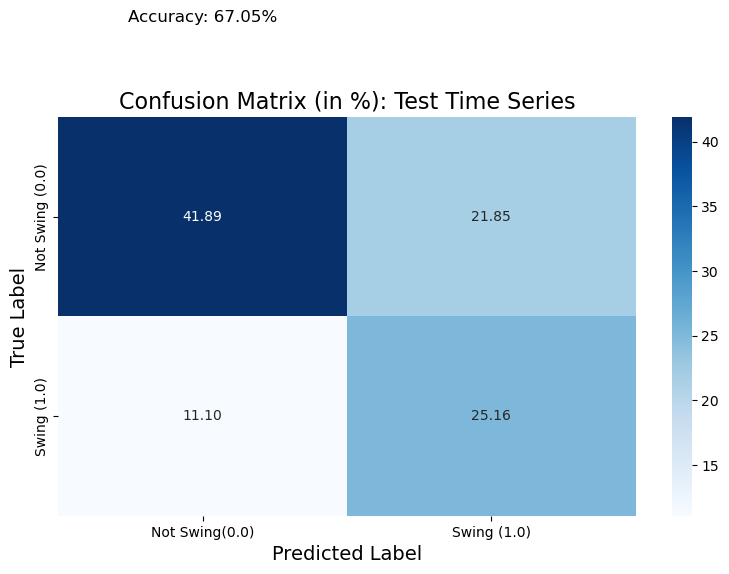

In [237]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_test_time, test_pred) / y_test_time.shape[0] * 100
#cm_values = confusion_matrix(y_test_2020_time, test_2020_pred) / y_test_2020_time.shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Test Time Series', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

In [238]:
from catboost import CatBoostClassifier
from sklearn.utils.class_weight import compute_class_weight

classes = np.array([False, True])  # Assuming binary classification
class_weights = compute_class_weight('balanced', classes=classes, y=y_train_time)

# Create the CatBoostClassifier
cat_model = CatBoostClassifier(iterations=1500, 
                           learning_rate=0.1, 
                           depth=8, 
                           class_weights=class_weights,
                              verbose=0)

cat_model.fit(X_train_time, y_train_time)

print("Validation")
# Predict Probabilities
y_val_pred = cat_model.predict(X_val_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_val_time, y_val_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_val_time, y_val_pred))
print("Accuracy:", accuracy_score(y_val_time, y_val_pred))

print("Test")
# Predict Probabilities
y_test_pred = cat_model.predict(X_test_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_test_time, y_test_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_test_time, y_test_pred))
print("Accuracy:", accuracy_score(y_test_time, y_test_pred))

print("Test 2020")
# Predict Probabilities
y_test_2020_pred = cat_model.predict(X_test_2020_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_test_2020_time, y_test_2020_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_test_2020_time, y_test_2020_pred))
print("Accuracy:", accuracy_score(y_test_2020_time, y_test_2020_pred))

Validation
Confusion Matrix:
[[3987 1034]
 [1047 1868]]
              precision    recall  f1-score   support

       False       0.79      0.79      0.79      5021
        True       0.64      0.64      0.64      2915

    accuracy                           0.74      7936
   macro avg       0.72      0.72      0.72      7936
weighted avg       0.74      0.74      0.74      7936

Accuracy: 0.7377772177419355
Test
Confusion Matrix:
[[4030 1029]
 [1003 1875]]
              precision    recall  f1-score   support

       False       0.80      0.80      0.80      5059
        True       0.65      0.65      0.65      2878

    accuracy                           0.74      7937
   macro avg       0.72      0.72      0.72      7937
weighted avg       0.74      0.74      0.74      7937

Accuracy: 0.743983872999874
Test 2020
Confusion Matrix:
[[6608  925]
 [ 507  240]]
              precision    recall  f1-score   support

       False       0.93      0.88      0.90      7533
        True       

In [239]:
# Check class distribution in the training data
print(y_train_time.value_counts()/len(y_train_time))
print(y_test_2020_time.value_counts()/len(y_test_2020_time))

swing_voter
False    0.638531
True     0.361469
Name: count, dtype: float64
swing_voter
False    0.909783
True     0.090217
Name: count, dtype: float64


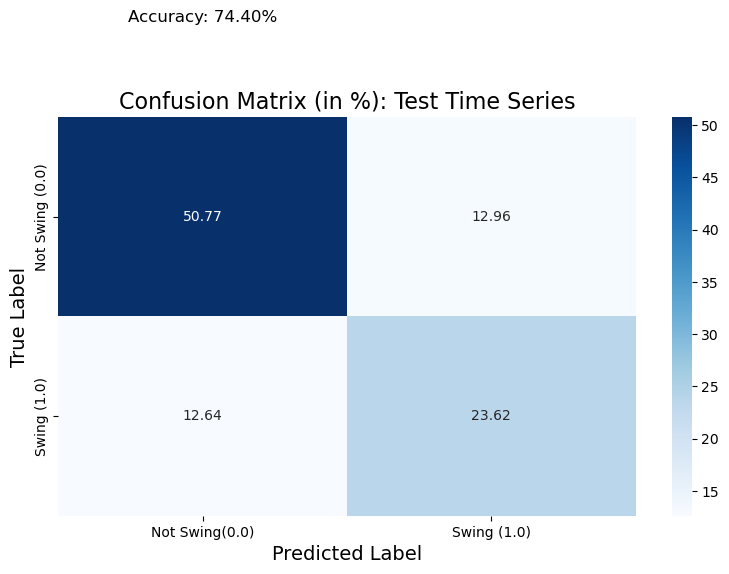

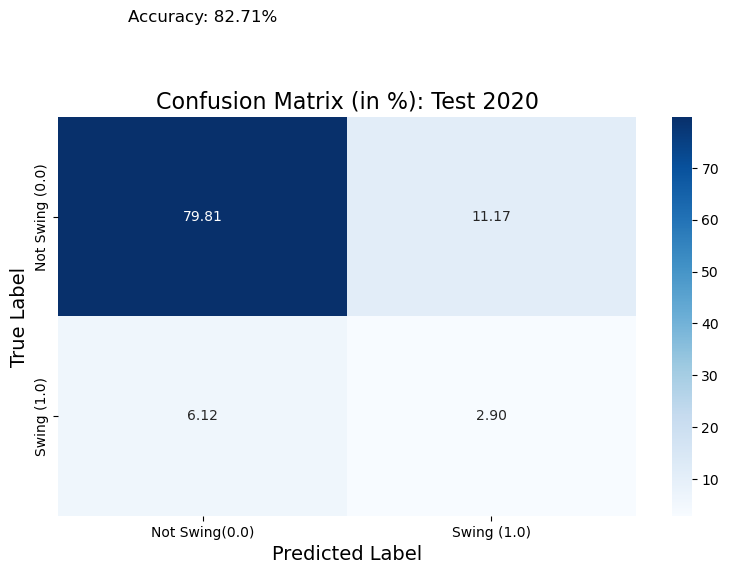

In [240]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_test_time, y_test_pred) / y_test_time.shape[0] * 100
cm_values_2020 = confusion_matrix(y_test_2020_time, y_test_2020_pred) / y_test_2020_time.shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Test Time Series', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()


plt.figure(figsize=(8, 6))
sns.heatmap(cm_values_2020, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Test 2020', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values_2020[0, 0] + cm_values_2020[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

## Feature Importance

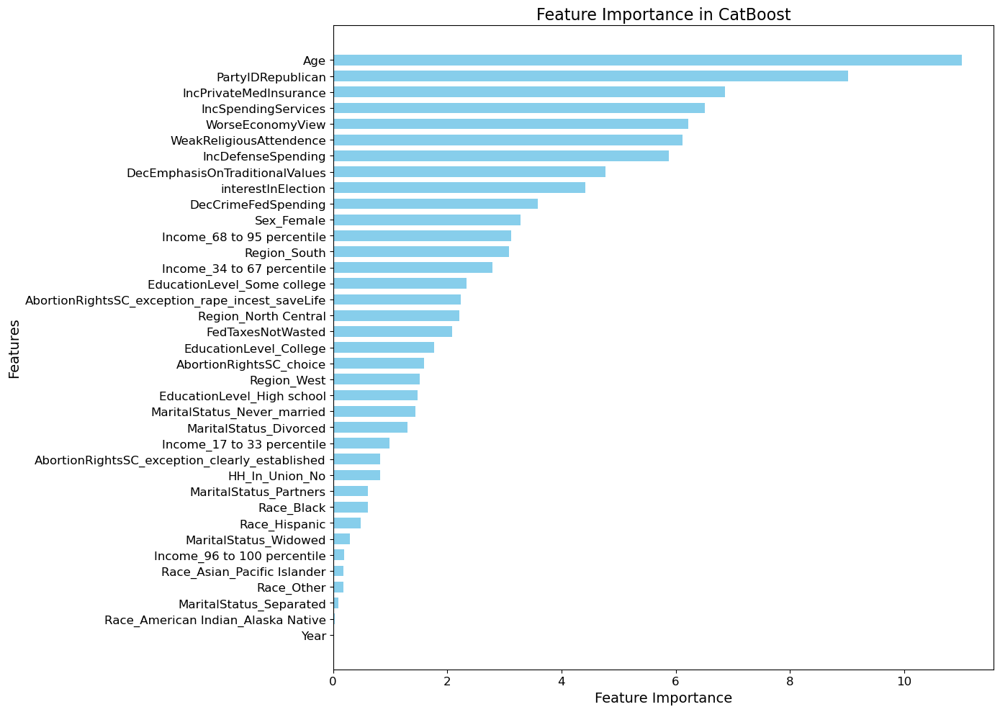

In [274]:
import matplotlib.pyplot as plt
import numpy as np

# Sort features by importance
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_features = feature_names[sorted_indices]
sorted_importances = feature_importances[sorted_indices]

# Set the figure size and style
plt.figure(figsize=(14, 10))  # Increase the figure size for better spacing

# Create a vertical space for the y-axis labels
y_positions = np.arange(len(sorted_features)) * 1.5  # Adjust spacing multiplier for more space

# Plot sorted feature importances
plt.barh(y_positions, sorted_importances, color='skyblue', height=1.0)

# Set custom y-ticks with spaced positions
plt.yticks(y_positions, sorted_features, fontsize=12)

# Customize labels and title
plt.xlabel("Feature Importance", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.title("Feature Importance in CatBoost", fontsize=16)
plt.xticks(fontsize=12)

# Invert y-axis to have the most important feature at the top
plt.gca().invert_yaxis()

# Adjust layout to ensure everything fits
plt.tight_layout()

# Show plot
plt.show()


# Exploring misclassified points


False Negatives (Class 1 Misclassified as Class 0) Demographics Summary:
        DecCrimeFedSpending  interestInElection          Year  \
count           507.000000          507.000000  5.070000e+02   
mean              0.953033           -0.069830  1.357952e+00   
std               1.593326            0.878432  1.333583e-15   
min              -0.765982           -1.381618  1.357952e+00   
25%              -0.765982           -0.126757  1.357952e+00   
50%               0.956431           -0.126757  1.357952e+00   
75%               2.678843            1.128105  1.357952e+00   
max               2.678843            1.128105  1.357952e+00   

       PartyIDRepublican  IncSpendingServices  WeakReligiousAttendence  \
count         507.000000           507.000000               507.000000   
mean            0.079383             0.433025                -0.412495   
std             0.766347             1.001268                 0.637016   
min            -1.264115            -1.731204       

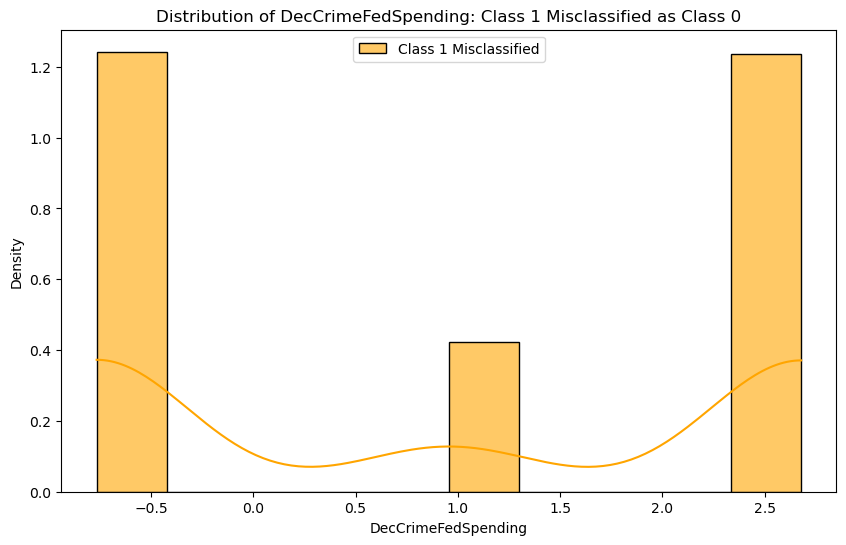

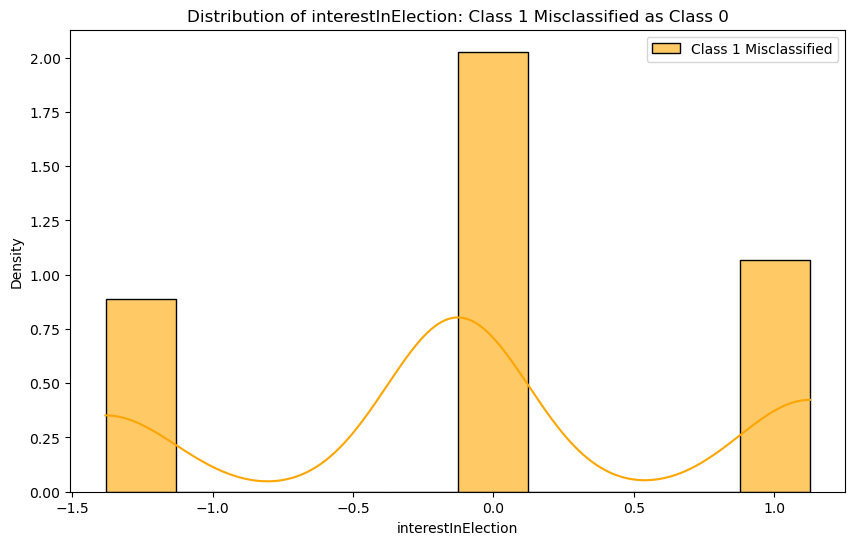

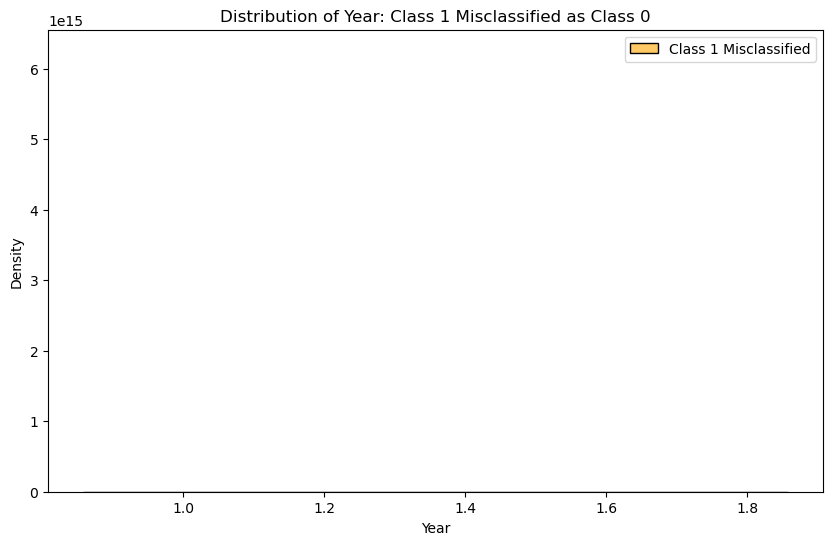

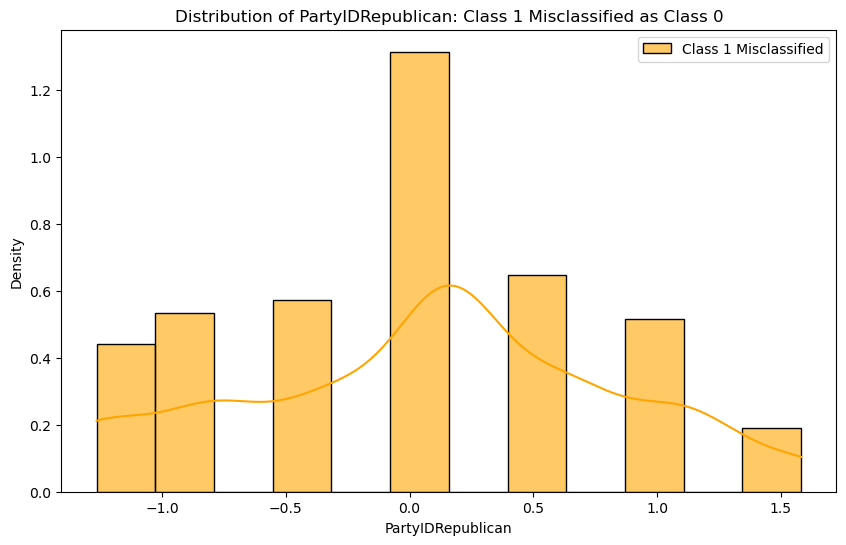

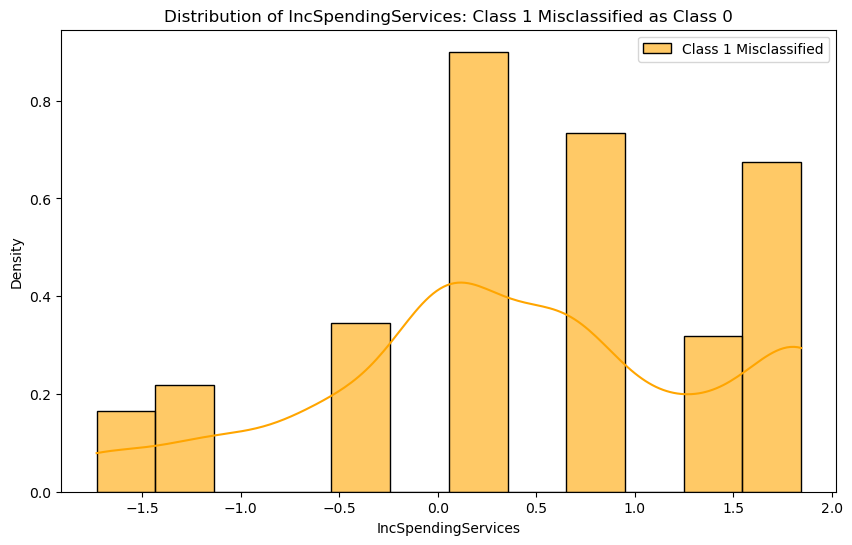

...

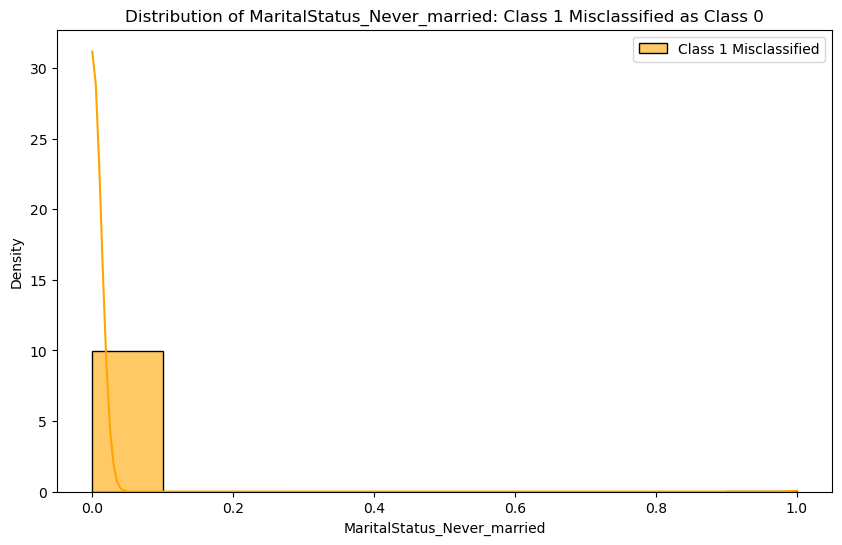

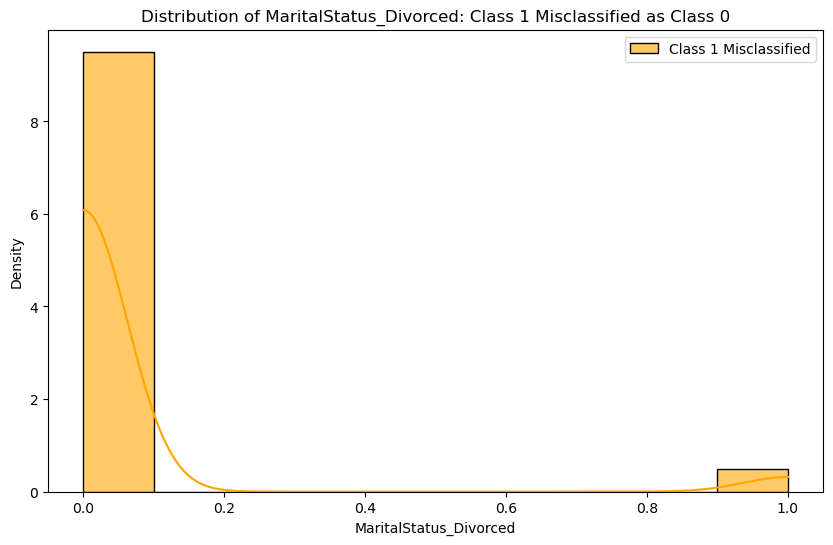

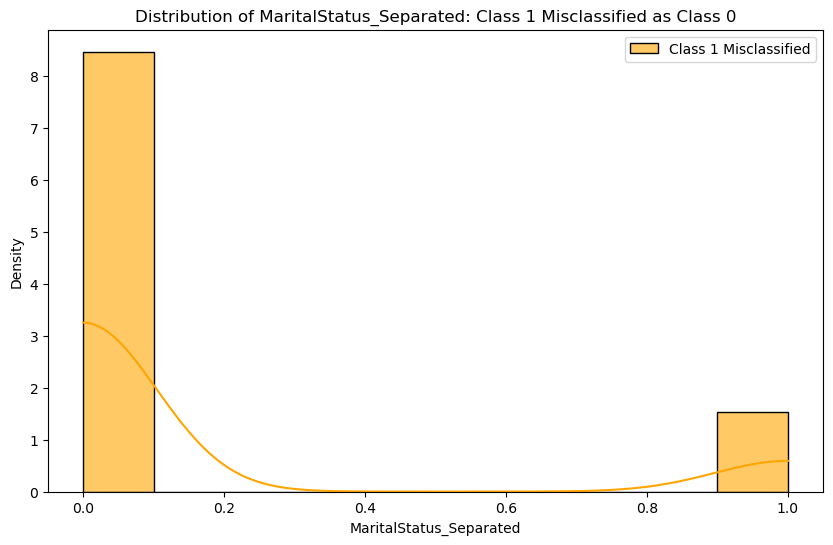

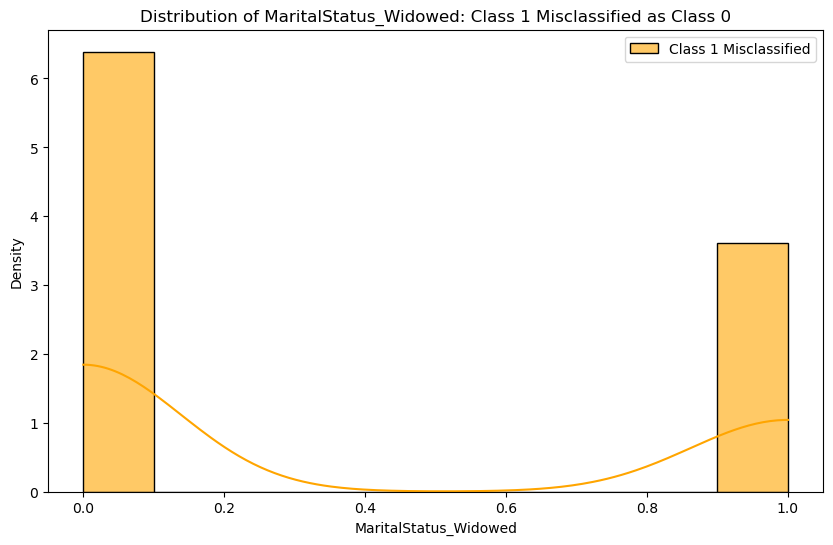

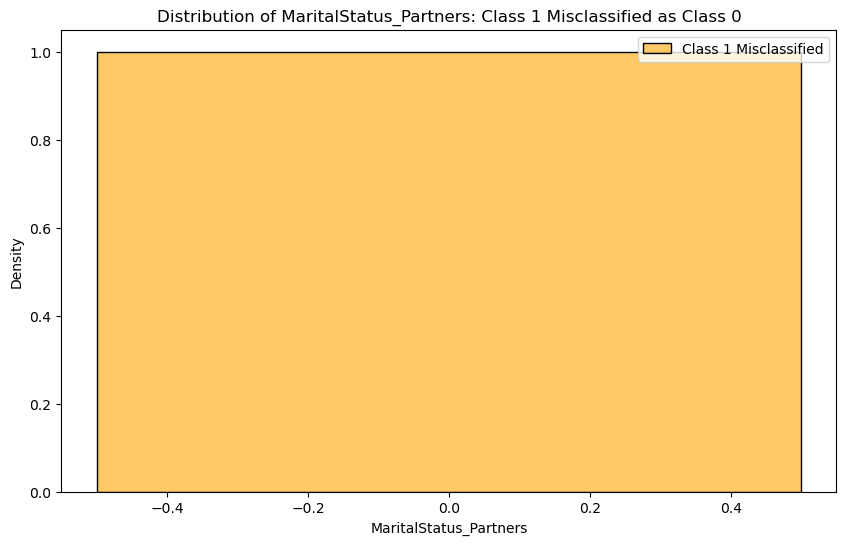

In [241]:
demographic_columns = X_test_2020_time.columns
# Identify Misclassified Instances for Class 1
false_negatives_indices = y_test_2020_time.index[
    (y_test_2020_time == 1) & (y_test_2020_pred == 0)
]

# Subset the misclassified instances for class 1
X_test_2020_false_negatives = X_test_2020_time.loc[false_negatives_indices]

# Demographic Analysis for Class 1 Misclassifications
false_negatives_demographics = X_test_2020_false_negatives[demographic_columns].describe()

# Print Summary Statistics
print("\nFalse Negatives (Class 1 Misclassified as Class 0) Demographics Summary:\n", 
      false_negatives_demographics)

# Visualize Demographics for Class 1 Misclassifications
for col in demographic_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(X_test_2020_false_negatives[col], label="Class 1 Misclassified", color="orange", kde=True, alpha=0.6, stat="density")
    plt.title(f"Distribution of {col}: Class 1 Misclassified as Class 0")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend()
    plt.show()



False Negatives (Class 1 Misclassified as Class 0) Demographics Summary:
        DecCrimeFedSpending  interestInElection          Year  \
count           507.000000          507.000000  5.070000e+02   
mean              0.953033           -0.069830  1.357952e+00   
std               1.593326            0.878432  1.333583e-15   
min              -0.765982           -1.381618  1.357952e+00   
25%              -0.765982           -0.126757  1.357952e+00   
50%               0.956431           -0.126757  1.357952e+00   
75%               2.678843            1.128105  1.357952e+00   
max               2.678843            1.128105  1.357952e+00   

       PartyIDRepublican  IncSpendingServices  WeakReligiousAttendence  \
count         507.000000           507.000000               507.000000   
mean            0.079383             0.433025                -0.412495   
std             0.766347             1.001268                 0.637016   
min            -1.264115            -1.731204       

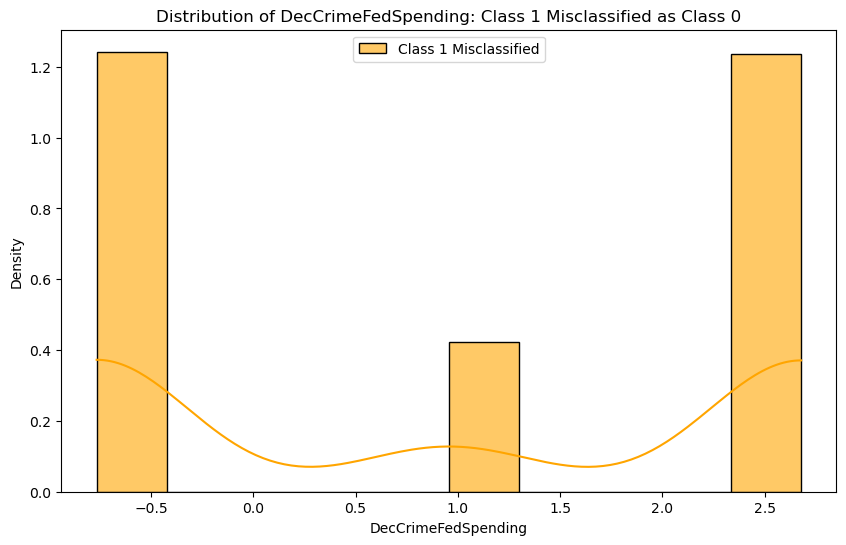

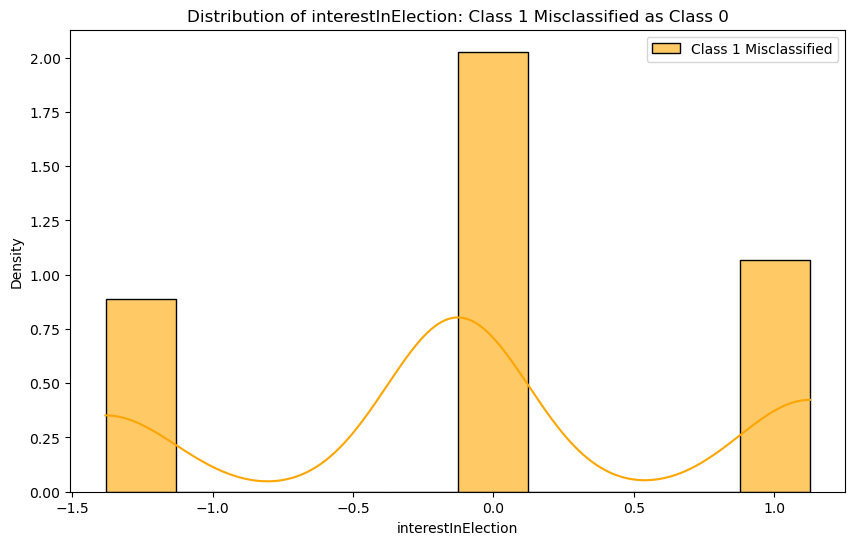

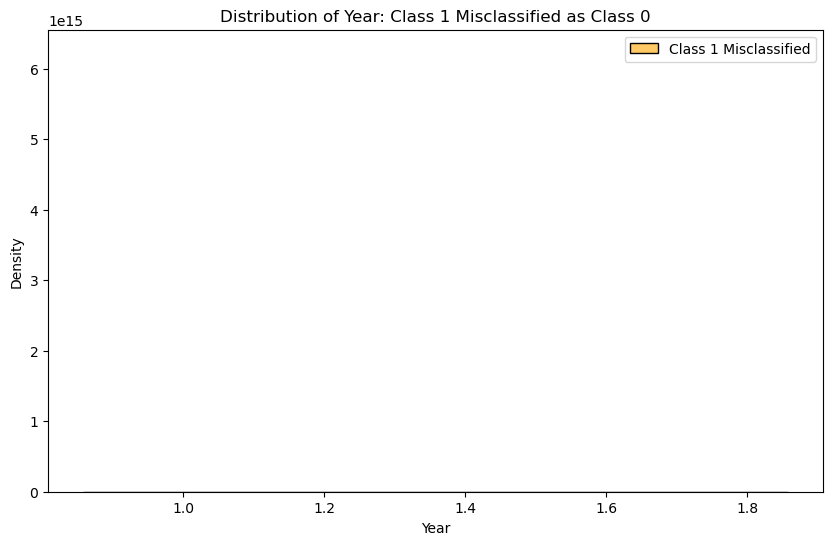

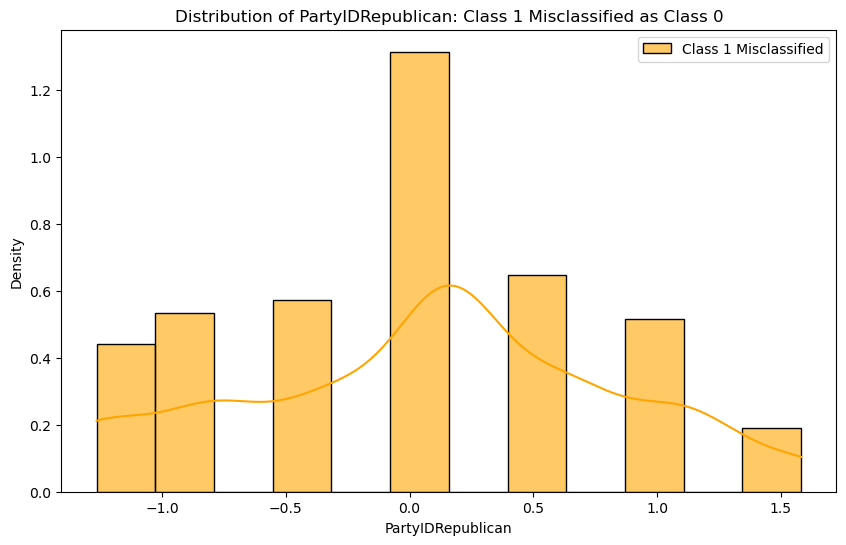

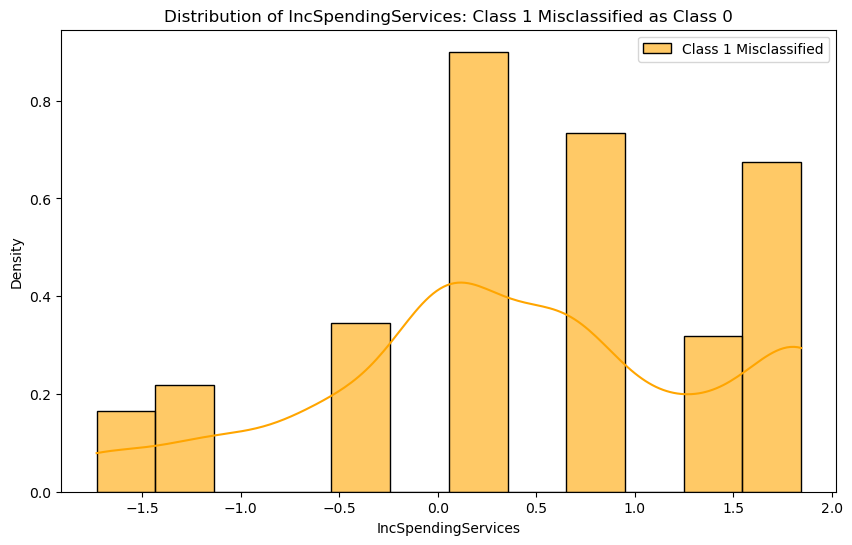

...

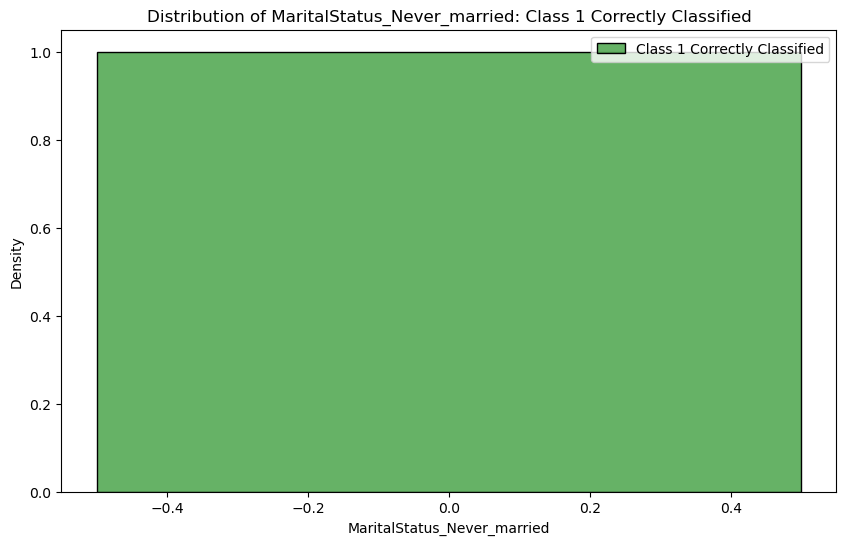

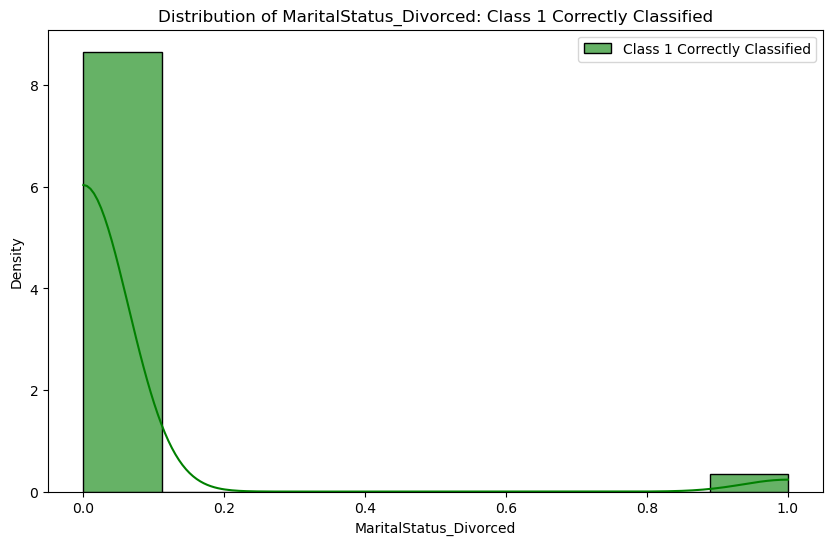

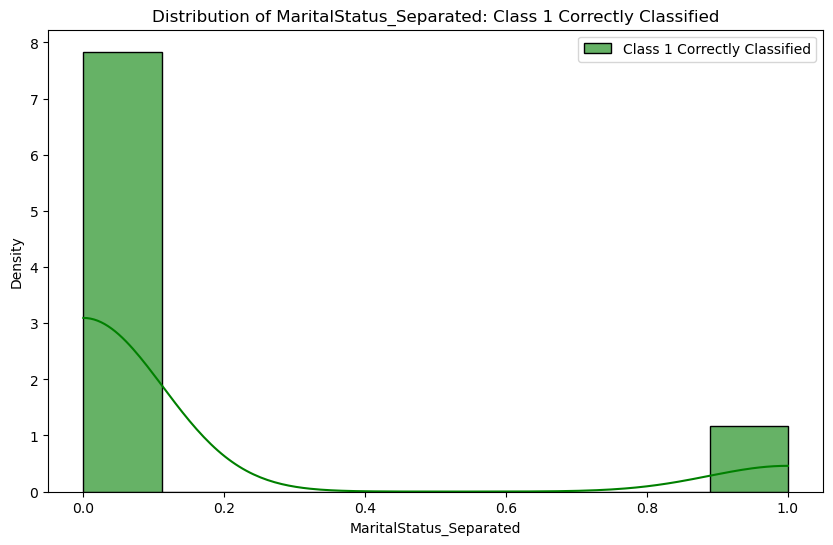

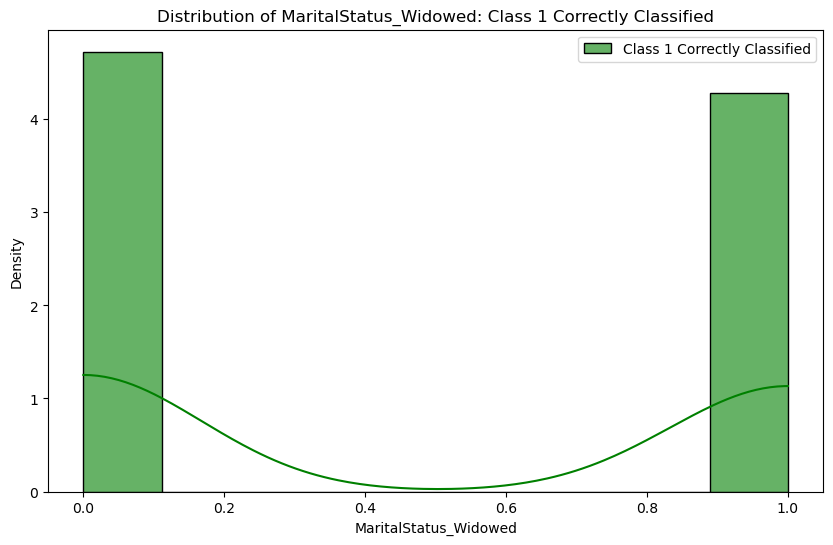

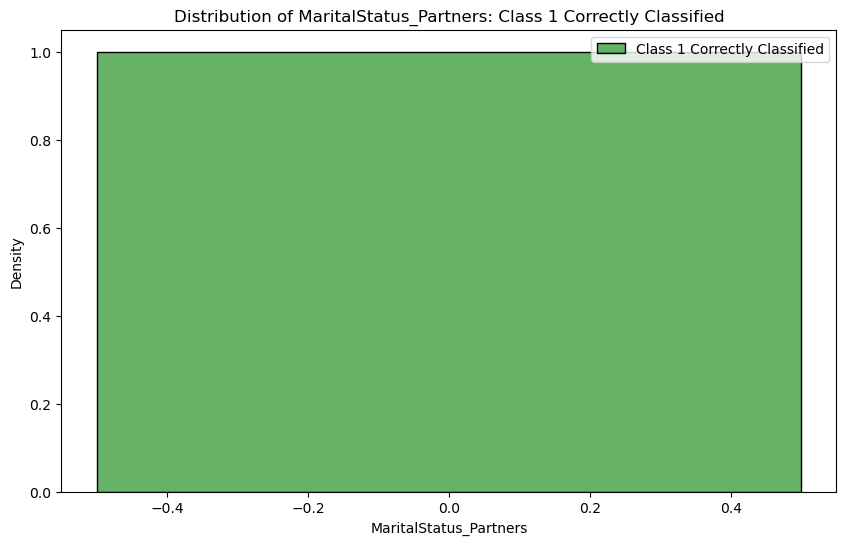

In [242]:
# Demographic columns to analyze
demographic_columns = X_test_2020_time.columns

# Identify Misclassified and Correctly Classified Instances for Class 1
false_negatives_indices = y_test_2020_time.index[
    (y_test_2020_time == 1) & (y_test_2020_pred == 0)
]
true_positives_indices = y_test_2020_time.index[
    (y_test_2020_time == 1) & (y_test_2020_pred == 1)
]

# Subset the misclassified instances (false negatives) and correctly classified instances (true positives) for class 1
X_test_2020_false_negatives = X_test_2020_time.loc[false_negatives_indices]
X_test_2020_true_positives = X_test_2020_time.loc[true_positives_indices]

# Demographic Analysis for Class 1 Misclassifications and Correct Classifications
false_negatives_demographics = X_test_2020_false_negatives[demographic_columns].describe()
true_positives_demographics = X_test_2020_true_positives[demographic_columns].describe()

# Print Summary Statistics for both
print("\nFalse Negatives (Class 1 Misclassified as Class 0) Demographics Summary:\n", 
      false_negatives_demographics)
print("\nTrue Positives (Class 1 Correctly Classified) Demographics Summary:\n", 
      true_positives_demographics)

# Visualize Demographics for Class 1 Misclassifications and Correct Classifications
# Plot for False Negatives (Misclassified Class 1)
for col in demographic_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(X_test_2020_false_negatives[col], label="Class 1 Misclassified", color="orange", kde=True, alpha=0.6, stat="density")
    plt.title(f"Distribution of {col}: Class 1 Misclassified as Class 0")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend()
    plt.show()

# Plot for True Positives (Correctly Classified Class 1)
for col in demographic_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(X_test_2020_true_positives[col], label="Class 1 Correctly Classified", color="green", kde=True, alpha=0.6, stat="density")
    plt.title(f"Distribution of {col}: Class 1 Correctly Classified")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend()
    plt.show()


In [243]:
pip install shap


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\15184\anaconda3\python.exe -m pip install --upgrade pip


In [244]:
# Calculate average feature importance for misclassified class 1 samples
mean_feature_importance = shap_values[0].mean(axis=0)

# Rank features by importance
important_features = pd.DataFrame({
    'Feature': misclassified_class_1.columns,
    'Importance': mean_feature_importance
}).sort_values(by='Importance', ascending=False)

print("Top features contributing to misclassification:")
print(important_features.head(10))


Top features contributing to misclassification:
                               Feature  Importance
0                  incCrimeFedSpending   -0.014765
19          Income_17 to 33 percentile   -0.014765
21          Income_68 to 95 percentile   -0.014765
22         Income_96 to 100 percentile   -0.014765
23                          Race_Black   -0.014765
24         Race_Asian_Pacific Islander   -0.014765
25  Race_American Indian_Alaska Native   -0.014765
26                       Race_Hispanic   -0.014765
27                          Race_Other   -0.014765
28                Region_North Central   -0.014765


In [245]:
# Calculate absolute importance to rank by magnitude
important_features['Absolute_Importance'] = important_features['Importance'].abs()

# Sort by absolute importance in descending order
sorted_important_features = important_features.sort_values(by='Absolute_Importance', ascending=False)

# Show top 10 features with the most influence on misclassification
print("Top features contributing to misclassification (most influential):")
print(sorted_important_features.head(10))


Top features contributing to misclassification (most influential):
                 Feature  Importance  Absolute_Importance
0    incCrimeFedSpending   -0.014765             0.014765
1     interestInElection   -0.014765             0.014765
2                   Year   -0.014765             0.014765
3                PartyID   -0.014765             0.014765
4  ScaleSpendingServices   -0.014765             0.014765
5    religiousAttendence   -0.014765             0.014765
6            EconomyView   -0.014765             0.014765
7                    Age   -0.014765             0.014765
8   ScaleDefenseSpending   -0.014765             0.014765
9      ScaleMedInsurance   -0.014765             0.014765


In [246]:
# Summarize misclassified data
misclassified_summary = misclassified_class_1[important_features['Feature'].values[:10]].describe(include='all')
print("Summary of misclassified class 1 data:")
misclassified_summary


Summary of misclassified class 1 data:


,incCrimeFedSpending,Income_17 to 33 percentile,Income_68 to 95 percentile,Income_96 to 100 percentile,Race_Black,Race_Asian_Pacific Islander,Race_American Indian_Alaska Native,Race_Hispanic,Race_Other,Region_North Central
count,652.000000,652,652,652,652,652,652,652,652,652
unique,NaN,2,2,2,2,2,2,2,2,2
top,NaN,False,False,False,False,False,False,False,False,False
freq,NaN,397,601,619,567,562,624,627,620,494
mean,0.898312,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,1.584980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,-0.765982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,-0.765982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,0.956431,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,2.678843,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Swap Train 2016, Test 2020


In [248]:
train_time_data = pd.read_csv('train_time_data.csv')
test_2016 = train_time_data[train_time_data['Year'] == 2016]

test_2016_scaled = test_2016

test_2016_scaled[numerical_features] = scaler.fit_transform(test_2016_scaled[numerical_features])
y_2016 =  test_2016_scaled['swing_voter']
X_2016 = test_2016_scaled.drop(columns = ['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote','swing_voter'])

C:\Users\15184\AppData\Local\Temp\ipykernel_11724\3295911377.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_2016_scaled[numerical_features] = scaler.fit_transform(test_2016_scaled[numerical_features])


In [250]:
print(y_2016.value_counts()/len(y_2016))
print(y_test_2020_time.value_counts()/len(y_test_2020_time))

swing_voter
False    0.782551
True     0.217449
Name: count, dtype: float64
swing_voter
False    0.909783
True     0.090217
Name: count, dtype: float64


In [251]:
from catboost import CatBoostClassifier
from sklearn.utils.class_weight import compute_class_weight
from functions import prepare_data

classes = np.array([False, True])  # Assuming binary classification
class_weights = compute_class_weight('balanced', classes=classes, y=y_train_time)

# Create the CatBoostClassifier
cat_model = CatBoostClassifier(iterations=1500, 
                           learning_rate=0.1, 
                           depth=8, 
                           class_weights=class_weights,
                              verbose=0)

cat_model.fit(X_2016, y_2016)

print("2016 Test")
# Predict Probabilities
y_test_2020 = cat_model.predict(X_test_2020_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_test_2020,y_test_2020_time)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_test_2020,y_test_2020_time))
print("Accuracy:", accuracy_score(y_test_2020,y_test_2020_time))

2016 Test
Confusion Matrix:
[[6256  652]
 [1277   95]]
              precision    recall  f1-score   support

       False       0.83      0.91      0.87      6908
        True       0.13      0.07      0.09      1372

    accuracy                           0.77      8280
   macro avg       0.48      0.49      0.48      8280
weighted avg       0.71      0.77      0.74      8280

Accuracy: 0.7670289855072464


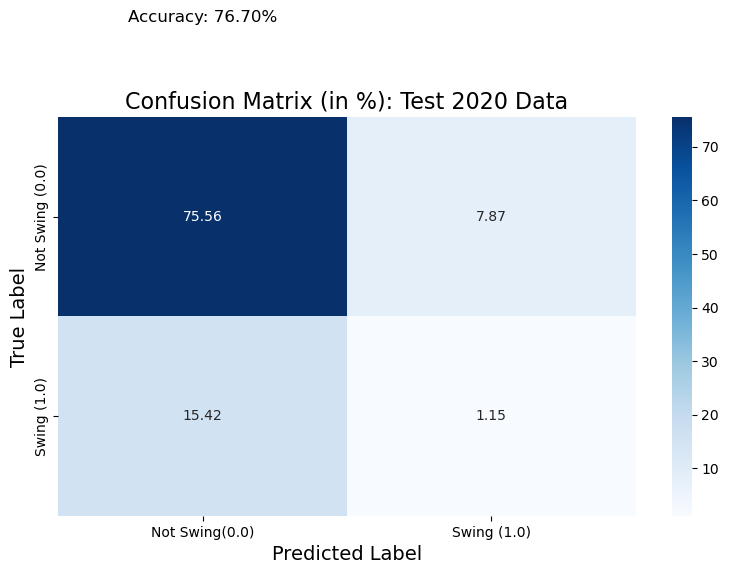

In [252]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_test_2020,y_test_2020_time) / y_test_2020.shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Test 2020 Data', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

# Stability Testing of Models/Data

In [253]:
import importlib
# Import the function
from functions import explore_data_helper

# Reload the module to reflect any updates
importlib.reload(explore_data_helper)

df_temp = X_train_time
df_temp['swing_voter'] = y_train_time

perturbed_data = [explore_data_helper.perturb_dataframe(df_temp) for i in range(100)]

In [254]:
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.utils.class_weight import compute_class_weight

def fit_models(df,cat):
    y = df['swing_voter']
    X = df.drop(columns = 'swing_voter')
    # Train CatBoost
    if cat:
        # Create the CatBoostClassifier
        classes = np.array([False, True])
        class_weights = compute_class_weight('balanced', classes=classes, y=y)
        cat_model = CatBoostClassifier(iterations=1500, 
                           learning_rate=0.1, 
                           depth=8, 
                           class_weights=class_weights,
                              verbose=0)
        cat_model.fit(X,y)
        return cat_model
    else:
        model = LogisticRegression(class_weight='balanced', random_state=42, penalty='l2', C=10, solver='liblinear')
        model.fit(X=X,y=y)

        return model

cat_perturbed = [fit_models(df,True) for df in perturbed_data]
LG_perturbed = [fit_models(df,False) for df in perturbed_data]

In [255]:
cat_perturbed_ = [cat_perturbed[i].predict(X_val_time) for i in range(100)]
LG_perturbed_ = [LG_perturbed[i].predict(X=X_val_time) for i in range(100)]

In [256]:
import numpy as np  # For cat_perturbed models

# Entropy calculation for cat_perturbed models
cat_entropy_new = []
for i in range(100):
    probs = cat_perturbed[i].predict_proba(X_val_time)[:, 1]  # Get probabilities for the positive class
    entropy = - (probs * np.log(probs + 1e-9) + (1 - probs) * np.log(1 - probs + 1e-9))  # Avoid log(0) with small epsilon
    cat_entropy_new.append(entropy)

# Entropy calculation for LG_perturbed models
LG_entropy_new = []
for i in range(100):
    probs = LG_perturbed[i].predict_proba(X_val_time)[:, 1]  # Ensure predict_proba is used instead of predict
    entropy = - (probs * np.log(probs + 1e-9) + (1 - probs) * np.log(1 - probs + 1e-9))
    LG_entropy_new.append(entropy)

# Aggregate (e.g., average entropy across models)
cat_avg_entropy_new = np.mean(cat_entropy_new, axis=0)  # Average entropy for cat_perturbed models
LG_avg_entropy_new = np.mean(LG_entropy_new, axis=0)  # Average entropy for LG_perturbed models


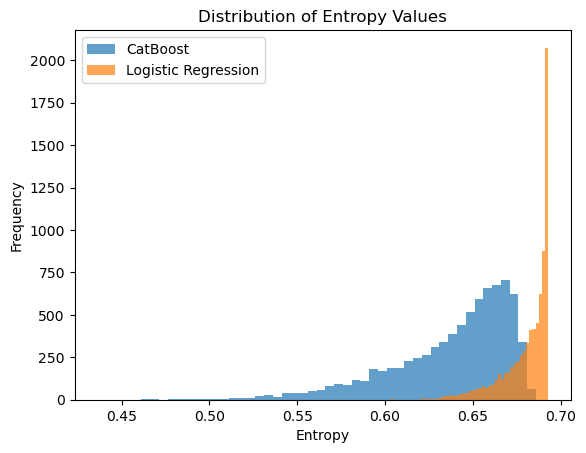

In [257]:
import matplotlib.pyplot as plt

plt.hist(cat_avg_entropy_new, bins=50, alpha=0.7, label="CatBoost")
plt.hist(LG_avg_entropy_new, bins=50, alpha=0.7, label="Logistic Regression")
plt.xlabel("Entropy")
plt.ylabel("Frequency")
plt.title("Distribution of Entropy Values")
plt.legend()
plt.show()


In [269]:
from sklearn.metrics import accuracy_score

# Thresholds
low_entropy_threshold = 0.63
high_entropy_threshold = 0.64

cat_final_predictions = np.mean(
    [cat_perturbed[i].predict(X_val_time) for i in range(100)],
    axis=0
).round() 


LG_final_predictions = np.mean(
    [LG_perturbed[i].predict(X_val_time) for i in range(100)],
    axis=0
).round() 


# Filter indices for low- and high-entropy groups
cat_low_entropy_indices = np.where(cat_avg_entropy_new < low_entropy_threshold)[0]
cat_high_entropy_indices = np.where(cat_avg_entropy_new >= high_entropy_threshold)[0]

LG_low_entropy_indices = np.where(LG_avg_entropy_new < low_entropy_threshold)[0]
LG_high_entropy_indices = np.where(LG_avg_entropy_new >= high_entropy_threshold)[0]

# Compute accuracy for CatBoost
cat_low_entropy_accuracy = accuracy_score(
    y_val_time[cat_low_entropy_indices],
    cat_final_predictions[cat_low_entropy_indices]
)
cat_high_entropy_accuracy = accuracy_score(
    y_val_time[cat_high_entropy_indices],
    cat_final_predictions[cat_high_entropy_indices]
)
# Overlap of high-entropy and misclassified samples
misclassified_indices_cat = np.where(cat_final_predictions != y_val_time)[0]
overlap_cat = np.intersect1d(misclassified_indices, cat_high_entropy_indices)

# Compute accuracy for Logistic Regression
LG_low_entropy_accuracy = accuracy_score(
    y_val_time[LG_low_entropy_indices],
    LG_final_predictions[LG_low_entropy_indices]
)
LG_high_entropy_accuracy = accuracy_score(
    y_val_time[LG_high_entropy_indices],
    LG_final_predictions[LG_high_entropy_indices]
)
misclassified_indices_LG = np.where(LG_final_predictions != y_val_time)[0]
overlap_LG = np.intersect1d(misclassified_indices, LG_high_entropy_indices)

# Print results
print(f"Number of high-entropy misclassified samples (CatBoost): {len(overlap_cat)}")
print(f"CatBoost Low-Entropy Accuracy: {cat_low_entropy_accuracy:.2f}")
print(f"CatBoost High-Entropy Accuracy: {cat_high_entropy_accuracy:.2f}")
print(f"Number of high-entropy misclassified samples: {len(overlap_LG)}")
print(f"Logistic Regression Low-Entropy Accuracy: {LG_low_entropy_accuracy:.2f}")
print(f"Logistic Regression High-Entropy Accuracy: {LG_high_entropy_accuracy:.2f}")


Number of high-entropy misclassified samples (CatBoost): 1544
CatBoost Low-Entropy Accuracy: 0.87
CatBoost High-Entropy Accuracy: 0.67
Number of high-entropy misclassified samples: 2069
Logistic Regression Low-Entropy Accuracy: 0.86
Logistic Regression High-Entropy Accuracy: 0.65


In [259]:
from itertools import product
perturb_options = list(product([2,5,7], 
                               ['none', 'standard'],
                               [0, 0.5],
                               ['numeric', 'dummy'],
                              [1962, 1972, 1982]))
perturb_options = pd.DataFrame(perturb_options, columns=('n_neighborhoods',
                                                         'transform_data',
                                                         'cor_feature_selection_threshold',
                                                         'convert_categorical',
                                                        'year_threshold'))
perturb_options

,n_neighborhoods,transform_data,cor_feature_selection_threshold,convert_categorical,year_threshold
0,2,none,0.0,numeric,1962
1,2,none,0.0,numeric,1972
2,2,none,0.0,numeric,1982
3,2,none,0.0,dummy,1962
4,2,none,0.0,dummy,1972
...,...,...,...,...,...
67,7,standard,0.5,numeric,1972
68,7,standard,0.5,numeric,1982
69,7,standard,0.5,dummy,1962
70,7,standard,0.5,dummy,1972


In [260]:
import importlib
# Import the function
from functions import explore_data_helper
import sys

# Reload the module to reflect any updates
importlib.reload(explore_data_helper)


def prepdata_for_jc_calls(path, knn_ks):
    # Add the directory containing the file to the Python path
    import sys, os
    sys.path.append(os.path.abspath(os.path.join(os.path.dirname(path), 'functions')))
    # Import the function
    from functions import load_data
    from functions import prepare_data
    from functions import  load_dictionaries_time_series
    # Reload the module to reflect any updates
    importlib.reload(load_data)
    importlib.reload(prepare_data)
    importlib.reload(load_dictionaries_time_series)
    
    dictionary = load_dictionaries_time_series.dict_time_series()
    column_labels = load_dictionaries_time_series.column_labels_time()
    
    df = load_data.load_data(path, dictionary)
    df = prepare_data.clean_columns(df, dictionary)
    knns = {}
    for k in knn_ks:
        knns[k] = prepare_data.knn_impute(df, dictionary, column_labels, k)
        
    return knns, dictionary, column_labels
        
df_jc_calls, dict_, cat_labels = prepdata_for_jc_calls(r"../data/anes_timeseries_cdf_csv_20220916.csv", 
                                                       perturb_options['n_neighborhoods'].unique())


C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\load_data.py:7: DtypeWarning: Columns (4,5,6,7,8,9,13,14,17,18,19,21,22,23,24,25,26,27,28,29,30,31,32,33,34,38,39,40,41,42,43,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,233,254,275,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,

In [270]:
df_jc_calls

{2:        DecCrimeFedSpending  interestInElection  DecIllegalAliens  \
 0                        2                   3                 4   
 1                        1                   3                 4   
 2                        2                   2                 4   
 3                        1                   3                 4   
 4                        2                   2                 4   
 ...                    ...                 ...               ...   
 68219                    1                   3                 3   
 68220                    1                   2                 3   
 68221                    2                   3                 3   
 68222                    1                   3                 4   
 68223                    3                   3                 1   
 
        PRE_IntentVote    Year  Sex  PartyIDRepublican  IncSpendingServices  \
 0                   1  1948.0    1                  2                    5   
 1       

In [271]:
cat_avg_entropy_new

array([0.66572193, 0.67403283, 0.66605094, ..., 0.67930092, 0.66096156,
       0.64130378])

In [261]:
importlib.reload(explore_data_helper)
# List to store both outputs
train_val_data_jc_time = [
    explore_data_helper.perturb_dataframe_assumptions(
        df_jc_calls,dict_,cat_labels,
        ['RegistrationStatus', 'Voted', 'VotePresident', 'PRE_IntentVote'],
        n_neighborhoods=perturb_options['n_neighborhoods'][i],
        transform_data=perturb_options['transform_data'][i],
        cor_feature_selection_threshold=perturb_options['cor_feature_selection_threshold'][i],
        convert_categorical=perturb_options['convert_categorical'][i],
        year_threshold=perturb_options['year_threshold'][i]
    )
    for i in range(perturb_options.shape[0])
]

# Unpack the outputs if needed
train_data_jc_time, val_data_jc_time = zip(*train_val_data_jc_time)

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Document

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Document

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Document

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Document

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\prepare_data.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["swing_voter"] = df.apply(is_swing_voter, axis=1)
C:\Users\15184\OneDrive\Document

In [262]:
for i in range(len(train_data_jc_time)):
    if train_data_jc_time[i]['swing_voter'].dtype != bool:
        print(train_data_jc_time[i]['swing_voter'], i)
        break

In [263]:
# Assuming true labels are y_val_time
from sklearn.metrics import accuracy_score

# Example for Logistic Regression (modify for CatBoost)
LG_final_predictions = np.mean([LG_perturbed[i].predict(X_val_time) for i in range(100)], axis=0).round()
misclassified_indices = np.where(LG_final_predictions != y_val_time)[0]

# High-entropy misclassified instances
high_entropy_threshold = 0.65  # Define a threshold for "high" entropy
high_entropy_indices = np.where(LG_avg_entropy_new > high_entropy_threshold)[0]
overlap = np.intersect1d(misclassified_indices, high_entropy_indices)
print(f"Number of high-entropy misclassified samples: {len(overlap)}")


# Accuracy evaluation for low- and high-entropy subsets
low_entropy_threshold = 0.45
low_entropy_indices = np.where(LG_avg_entropy_new <= low_entropy_threshold)[0]

# Accuracy for low-entropy predictions
low_entropy_accuracy = accuracy_score(
    y_val_time[low_entropy_indices],
    LG_final_predictions[low_entropy_indices]
)
print(f"Low-Entropy Accuracy (CatBoost): {low_entropy_accuracy:.2f}")

# Accuracy for high-entropy predictions
high_entropy_accuracy = accuracy_score(
    y_val_time[high_entropy_indices],
    LG_final_predictions[high_entropy_indices]
)
print(f"High-Entropy Accuracy (CatBoost): {high_entropy_accuracy:.2f}")

Number of high-entropy misclassified samples: 2710
Low-Entropy Accuracy (CatBoost): nan
High-Entropy Accuracy (CatBoost): 0.64


C:\Users\15184\anaconda3\Lib\site-packages\numpy\lib\function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
C:\Users\15184\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [264]:
from sklearn.metrics import accuracy_score
import numpy as np

# Assuming true labels are y_val_time

# Step 1: Aggregate final predictions for CatBoost
cat_final_predictions = np.mean(
    [cat_perturbed[i].predict(X_val_time) for i in range(100)],
    axis=0
).round()  # Average predictions, then round for binary classification

# Step 2: Identify misclassified samples
misclassified_indices = np.where(cat_final_predictions != y_val_time)[0]

# Step 3: High-entropy misclassified instances
high_entropy_threshold = 0.65  # Define a threshold for "high" entropy
high_entropy_indices = np.where(cat_avg_entropy_new > high_entropy_threshold)[0]

# Overlap of high-entropy and misclassified samples
overlap = np.intersect1d(misclassified_indices, high_entropy_indices)
print(f"Number of high-entropy misclassified samples (CatBoost): {len(overlap)}")

# Step 4: Accuracy evaluation for low- and high-entropy subsets
low_entropy_threshold = 0.45
low_entropy_indices = np.where(cat_avg_entropy_new <= low_entropy_threshold)[0]

# Accuracy for low-entropy predictions
low_entropy_accuracy = accuracy_score(
    y_val_time[low_entropy_indices],
    cat_final_predictions[low_entropy_indices]
)
print(f"Low-Entropy Accuracy (CatBoost): {low_entropy_accuracy:.2f}")

# Accuracy for high-entropy predictions
high_entropy_accuracy = accuracy_score(
    y_val_time[high_entropy_indices],
    cat_final_predictions[high_entropy_indices]
)
print(f"High-Entropy Accuracy (CatBoost): {high_entropy_accuracy:.2f}")

Number of high-entropy misclassified samples (CatBoost): 1308
Low-Entropy Accuracy (CatBoost): 1.00
High-Entropy Accuracy (CatBoost): 0.65


In [265]:
cat_perturbed_jc = [fit_models(df,True) for df in train_data_jc_time]
LG_perturbed_jc = [fit_models(df,False) for df in train_data_jc_time]

In [266]:
# compute the predictions on the validaion set for ls_area_perturbed, ls_multi_perturbed, ls_all_perturbed, ridge_perturbed, and lasso_perturbed
cat_perturbed_jc_res = [cat_perturbed_jc[i].predict(val_data_jc_time[i].drop(columns='swing_voter')) for i in range(len(val_data_jc_time))]
LG_perturbed_jc_res = [LG_perturbed_jc[i].predict(val_data_jc_time[i].drop(columns='swing_voter')) for i in range(len(val_data_jc_time))]

In [267]:
# Compute correlations for each entry in the results
correlation_results = []
for i, res in enumerate(cat_perturbed_jc_res):
    y_true = val_data_jc_time[i]['swing_voter']

    # Compute the r2_score for both models
    cat_corr = accuracy_score(y_true, res)
    LG_corr = accuracy_score(y_true, LG_perturbed_jc_res[i])
    
    # Append correlation results with perturbation details
    correlation_results.append({
        'perturb_option': perturb_options.iloc[i].to_dict(),
        'cat_perturbed_jc_corr': cat_corr,
        'LG_perturbed_jc_corr': LG_corr
    })


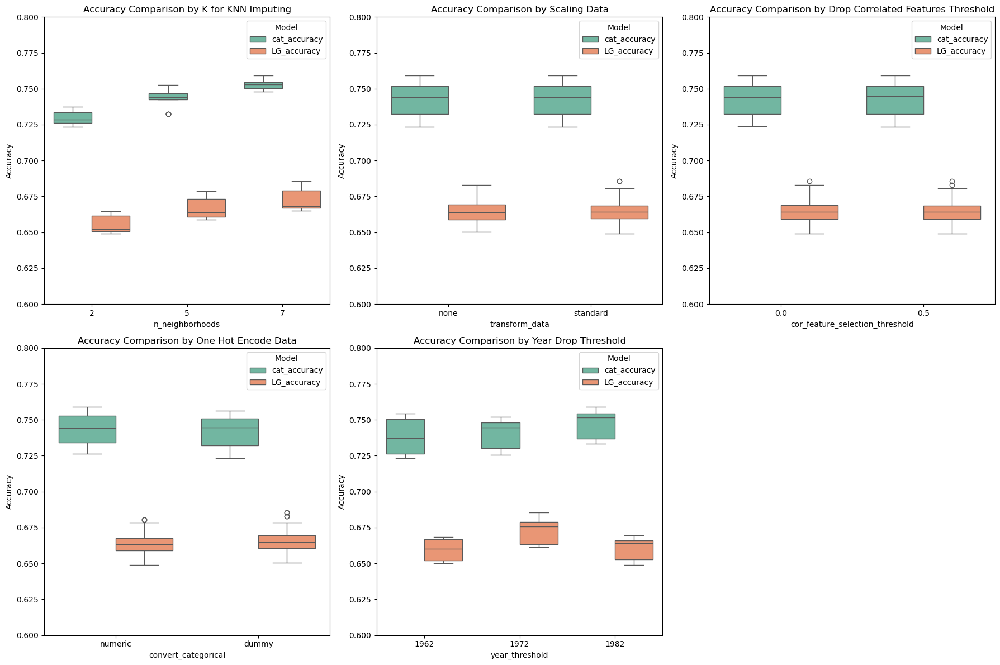

In [268]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Prepare the data for plotting
accuracy_data = []

# Extract relevant data
for result in correlation_results:
    perturb_option = result['perturb_option']
    cat_acc = result['cat_perturbed_jc_corr']
    lg_acc = result['LG_perturbed_jc_corr']
    
    # Create a dictionary for each perturbation and its corresponding accuracy scores
    accuracy_data.append({
        'n_neighborhoods': perturb_option['n_neighborhoods'],
        'transform_data': perturb_option['transform_data'],
        'cor_feature_selection_threshold': perturb_option['cor_feature_selection_threshold'],
        'convert_categorical': perturb_option['convert_categorical'],
        'year_threshold': perturb_option['year_threshold'],
        'cat_accuracy': cat_acc,
        'LG_accuracy': lg_acc
    })

# Convert the data into a DataFrame
df_accuracy = pd.DataFrame(accuracy_data)

# Melt the DataFrame to have 'Accuracy Type' column for easier plotting
df_melted = df_accuracy.melt(id_vars=['n_neighborhoods', 'transform_data', 'cor_feature_selection_threshold', 'convert_categorical', 'year_threshold'], 
                              value_vars=['cat_accuracy', 'LG_accuracy'], 
                              var_name='Model', value_name='Accuracy')

# Function to create box plots for a given parameter
def create_box_plot(df_melted, group_by_param, ax, title):
    sns.boxplot(x=group_by_param, y='Accuracy', hue='Model', data=df_melted, ax=ax, palette='Set2')
    ax.set_ylim(.6, .8)  # Ensure accuracy values are between 0 and 1
    ax.set_title(f'Accuracy Comparison by {title}')

# Create a figure with subplots for each parameter
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))

# Plot for 'n_neighborhoods'
df_melted_n_neigh = df_melted.dropna(subset=['n_neighborhoods'])
create_box_plot(df_melted_n_neigh, 'n_neighborhoods', axes[0, 0], 'K for KNN Imputing')

# Plot for 'transform_data'
df_melted_transform = df_melted.dropna(subset=['transform_data'])
create_box_plot(df_melted_transform, 'transform_data', axes[0, 1], 'Scaling Data')

# Plot for 'cor_feature_selection_threshold'
df_melted_threshold = df_melted.dropna(subset=['cor_feature_selection_threshold'])
create_box_plot(df_melted_threshold, 'cor_feature_selection_threshold', axes[0, 2], 'Drop Correlated Features Threshold')

# Plot for 'convert_categorical'
df_melted_categorical = df_melted.dropna(subset=['convert_categorical'])
create_box_plot(df_melted_categorical, 'convert_categorical', axes[1, 0], 'One Hot Encode Data')

# Plot for 'year_threshold'
df_melted_year = df_melted.dropna(subset=['year_threshold'])
create_box_plot(df_melted_year, 'year_threshold', axes[1, 1], 'Year Drop Threshold')

axes[1, 2].set_visible(False)
# Adjust layout and show plot
plt.tight_layout()
plt.show()
